In [1]:
import os
import sys
import random
import numpy as np
import pandas as pd
from typing import List, Tuple
from itertools import combinations
from tqdm import tqdm  # For progress bar

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.feature_selection import VarianceThreshold

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

from scipy.stats import zscore
from scipy.spatial.distance import cosine

from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import (
    RandomForestClassifier,
    ExtraTreesClassifier
)
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
from sklearn.mixture import GaussianMixture as GMM
from sklearn.metrics import (
    accuracy_score,
    roc_auc_score,
    classification_report,
    confusion_matrix,
    make_scorer
)

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

from tpot import TPOTClassifier
from autogluon.tabular import TabularPredictor

import optuna

import shap



# Utils

In [2]:
def create_extra_features(df):
    best = np.where(df['hearing(left)'] < df['hearing(right)'], 
                    df['hearing(left)'],  df['hearing(right)'])
    worst = np.where(df['hearing(left)'] < df['hearing(right)'], 
                     df['hearing(right)'],  df['hearing(left)'])
    df['hearing(left)'] = best - 1
    df['hearing(right)'] = worst - 1
    
    df['eyesight(left)'] = np.where(df['eyesight(left)'] > 9, 0, df['eyesight(left)'])
    df['eyesight(right)'] = np.where(df['eyesight(right)'] > 9, 0, df['eyesight(right)'])
    best = np.where(df['eyesight(left)'] < df['eyesight(right)'], 
                    df['eyesight(left)'],  df['eyesight(right)'])
    worst = np.where(df['eyesight(left)'] < df['eyesight(right)'], 
                     df['eyesight(right)'],  df['eyesight(left)'])
    df['eyesight(left)'] = best
    df['eyesight(right)'] = worst
    ##
    df['Gtp'] = np.clip(df['Gtp'], 0, 300)
    df['HDL'] = np.clip(df['HDL'], 0, 110)
    df['LDL'] = np.clip(df['LDL'], 0, 200)
    df['ALT'] = np.clip(df['ALT'], 0, 150)
    df['AST'] = np.clip(df['AST'], 0, 100)
    df['serum creatinine'] = np.clip(df['serum creatinine'], 0, 3)  
    
    return df
def generate_features(df: pd.DataFrame) -> pd.DataFrame:
    # Copy the original DataFrame
    df = df.copy()
    df['BMI'] = df['weight(kg)'] / (df['height(cm)']/100)**2

    # Basic interaction features (pairwise multiplications)
    interaction_features = ['height(cm)', 'weight(kg)', 'waist(cm)', 'BMI']
    for i, feature1 in enumerate(interaction_features):
        for feature2 in interaction_features[i + 1:]:
            df[f'{feature1}_x_{feature2}'] = df[feature1] * df[feature2]
    
    print(f'Shape before generating polynomial features: {df.shape}')
    # Polynomial features for selected numerical columns
    poly_features = ['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'BMI']
    poly = PolynomialFeatures(degree=2, include_bias=False, interaction_only=False)
    poly_data = poly.fit_transform(df[poly_features])
    poly_columns = poly.get_feature_names_out(poly_features)
    poly_df = pd.DataFrame(poly_data, columns=poly_columns, index=df.index)
    df = pd.concat([df, poly_df.drop(columns=poly_features)], axis=1)  # Avoid duplicating original features
    print(f'Shape after generating polynomial features: {df.shape}')
    # Ratio features
    df['weight_height_ratio'] = df['weight(kg)'] / (df['height(cm)'] + 1e-5)
    df['waist_height_ratio'] = df['waist(cm)'] / (df['height(cm)'] + 1e-5)
    df['BMI_age_ratio'] = df['BMI'] / (df['age'] + 1e-5)

    # Log-transform for skewed features
    skewed_features = ['systolic', 'relaxation', 'Cholesterol', 'triglyceride', 'LDL', 'Gtp']
    for feature in skewed_features:
        df[f'log_{feature}'] = np.log1p(df[feature])

    # Combined health metrics
    df['lipid_ratio'] = df['LDL'] / (df['HDL'] + 1e-5)
    df['cholesterol_ratio'] = df['Cholesterol'] / (df['triglyceride'] + 1e-5)
    df['AST_ALT_ratio'] = df['AST'] / (df['ALT'] + 1e-5)
    
    # Statistical aggregations
    df['mean_blood_metrics'] = df[['systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol']].mean(axis=1)
    df['std_blood_metrics'] = df[['systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol']].std(axis=1)

    # Physical condition indicators
    df['obesity_flag'] = (df['BMI'] > 30).astype(int)
    df['low_BMI_flag'] = (df['BMI'] < 18.5).astype(int)
    df['high_waist_flag'] = (df['waist(cm)'] > 102).astype(int)

    return df

# Plot Confusion Matrix
def plot_confusion_matrix(model, X_test, y_test, cmap=plt.cm.Blues):
    plt.figure(figsize=(8, 8))
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap=cmap, cbar=False, square=True, xticklabels=y_test.unique(), yticklabels=y_test.unique())
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

def balance_classes(X, y, method='over'):
    
    if method == 'over':
        sampler = RandomOverSampler(sampling_strategy='minority', random_state=42)
    elif method == 'under':
        sampler = RandomUnderSampler(sampling_strategy='majority', random_state=42)
    else:
        raise ValueError('Invalid method. Choose "over" or "under".')
    
    X_resampled, y_resampled = sampler.fit_resample(X, y)
    return X_resampled, y_resampled

def create_interaction_features(X):
    # For each column pair, create a new column with the product,add,min,max,sub,div,diff
    # Unique pairs of columns
    column_pairs = list(combinations(X.columns, 2))
    print(f'Number of column pairs: {len(column_pairs)}')
    for col_pair in tqdm(column_pairs):
        col1, col2 = col_pair
        # X[f'{col1}_add_{col2}'] = X[col1] + X[col2]
        # X[f'{col1}_sub_{col2}'] = X[col1] - X[col2]
        # X[f'{col1}_product_{col2}'] = X[col1] * X[col2]
        X[f'{col1}_div_{col2}'] = X[col1] / (X[col2] + 1e-5)

    return X
def reduce_dimensionality_pca(data: pd.DataFrame, n_components: int = 2) -> pd.DataFrame:
    pca = PCA(n_components=n_components, random_state=42)
    reduced_data = pca.fit_transform(data)
    return pd.DataFrame(reduced_data, columns=[f'PC{i+1}' for i in range(n_components)])

def reduce_dimensionality_tsne(data: pd.DataFrame, n_components: int = 2, perplexity: float = 30.0) -> pd.DataFrame:
    tsne = TSNE(n_components=n_components, perplexity=perplexity, random_state=42)
    reduced_data = tsne.fit_transform(data)
    return pd.DataFrame(reduced_data, columns=[f'Dim{i+1}' for i in range(n_components)])

def reduce_dimensionality_umap(data: pd.DataFrame, n_components: int = 2, n_neighbors: int = 15, min_dist: float = 0.1) -> pd.DataFrame:
    umap_model = umap.UMAP(n_components=n_components, n_neighbors=n_neighbors, min_dist=min_dist, random_state=42)
    reduced_data = umap_model.fit_transform(data)
    return pd.DataFrame(reduced_data, columns=[f'Dim{i+1}' for i in range(n_components)])

# Function that removes outliers based on IQR
def clean_outliers(df, column,clip=False):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    print(f'For column {column} the lower bound is {lower_bound} and the upper bound is {upper_bound}')
    if clip:
        df[column] = df[column].clip(lower_bound, upper_bound)
    else:
        df = df[(df[column] > lower_bound) & (df[column] < upper_bound)]
    return df


def optimize_model_with_cv(model_class, X, y, param_distributions, k=5, random_seed=42, n_trials=50):
    def objective(trial):
        # Sample hyperparameters from the provided distributions
        params = {key: trial.suggest_categorical(key, values) if isinstance(values, list) else trial.suggest_float(key, *values)
                  for key, values in param_distributions.items()}
        
        # Create the model instance with sampled hyperparameters
        model = model_class(**params)
        
        # Perform K-fold cross-validation
        skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=random_seed)
        scores = cross_val_score(model, X, y, scoring=make_scorer(accuracy_score), cv=skf, n_jobs=-1)
        
        # Return the mean accuracy as the objective value
        return scores.mean()

# set options max cols
pd.set_option('display.max_columns', None)

In [123]:
# Reading the data
df = pd.read_csv(r'/Users/adirserruya/Projects/MLCourse/HW2-Kaggle/quitting-smoking-bgu-2025/train.csv')

In [45]:
# Count duplicates in df
duplicates = df.duplicated()
print(f'Number of duplicates: {duplicates.sum()}')


Number of duplicates: 0


In [46]:
df.describe()[1:].T.style.background_gradient(cmap='coolwarm')

,mean,std,min,25%,50%,75%,max
id,79627.500000,45973.391572,0.000000,39813.750000,79627.500000,119441.250000,159255.000000
age,44.306626,11.842286,20.000000,40.000000,40.000000,55.000000,85.000000
height(cm),165.266929,8.818970,135.000000,160.000000,165.000000,170.000000,190.000000
weight(kg),67.143662,12.586198,30.000000,60.000000,65.000000,75.000000,130.000000
waist(cm),83.001990,8.957937,51.000000,77.000000,83.000000,89.000000,127.000000
eyesight(left),1.005798,0.402113,0.100000,0.800000,1.000000,1.200000,9.900000
eyesight(right),1.000989,0.392299,0.100000,0.800000,1.000000,1.200000,9.900000
hearing(left),1.023974,0.152969,1.000000,1.000000,1.000000,1.000000,2.000000
hearing(right),1.023421,0.151238,1.000000,1.000000,1.000000,1.000000,2.000000
systolic,122.503648,12.729315,77.000000,114.000000,121.000000,130.000000,213.000000


In [47]:
# Find all columns with other values instead of numerical values, try to convert them to numerical values
for col in df.columns:
    if df[col].dtype == 'object':
        print(col, df[col].unique())
# Replace infs with NaNs
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.isna().sum()


id                     0
age                    0
height(cm)             0
weight(kg)             0
waist(cm)              0
eyesight(left)         0
eyesight(right)        0
hearing(left)          0
hearing(right)         0
systolic               0
relaxation             0
fasting blood sugar    0
Cholesterol            0
triglyceride           0
HDL                    0
LDL                    0
hemoglobin             0
Urine protein          0
serum creatinine       0
AST                    0
ALT                    0
Gtp                    0
dental caries          0
smoking                0
dtype: int64

In [5]:
target_col = 'smoking'
cat_cols = ['hearing(left)','hearing(right)','Urine protein','dental caries']

In [124]:
# train test split
X = df.drop(columns=[target_col])
y = df[target_col]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
z_scores = np.abs(zscore(df.select_dtypes(include=[np.number])))
print((z_scores > 4).sum(axis=0))
X_train = X_train[(z_scores < 4).all(axis=1)]
y_train = y_train[(z_scores < 4).all(axis=1)]


id                        0
age                       0
height(cm)                0
weight(kg)               32
waist(cm)                16
eyesight(left)          132
eyesight(right)         117
hearing(left)          3818
hearing(right)         3730
systolic                 77
relaxation               38
fasting blood sugar    1256
Cholesterol              34
triglyceride            189
HDL                      97
LDL                      26
hemoglobin              305
Urine protein          2785
serum creatinine         78
AST                     705
ALT                     703
Gtp                    1330
dental caries             0
smoking                   0
dtype: int64


# AutoML Tool #1 - [TPOT](https://epistasislab.github.io/tpot/)

In [ ]:
# Subsample of the original dataset because its too large to use TPOT
X_train_sub = X_train.sample(frac=0.1, random_state=42)
y_train_sub = y_train.loc[X_train_sub.index]

In [51]:
from tpot import TPOTClassifier
pipeline_optimizer = TPOTClassifier()
pipeline_optimizer = TPOTClassifier(generations=10, population_size=10, cv=3,
                                    random_state=42, verbosity=2)
pipeline_optimizer.fit(X_train_sub, y_train_sub)


Optimization Progress:   0%|          | 0/110 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.769760229937221

Generation 2 - Current best internal CV score: 0.7708191513501248

Generation 3 - Current best internal CV score: 0.7709704258376825

Generation 4 - Current best internal CV score: 0.7709704258376825

Generation 5 - Current best internal CV score: 0.7709704258376825

Generation 6 - Current best internal CV score: 0.7709704258376825

Generation 7 - Current best internal CV score: 0.7709704258376825

Generation 8 - Current best internal CV score: 0.7709704258376825

Generation 9 - Current best internal CV score: 0.7709704258376825

Generation 10 - Current best internal CV score: 0.7709704258376825

Best pipeline: RandomForestClassifier(MinMaxScaler(input_matrix), bootstrap=False, criterion=gini, max_features=0.2, min_samples_leaf=8, min_samples_split=4, n_estimators=100)


TPOTClassifier(cv=3, generations=10, population_size=10, random_state=42,
               verbosity=2)

In [53]:
print(pipeline_optimizer.score(X_test, y_test))
print(roc_auc_score(y_train_sub,pipeline_optimizer.predict_proba(X_train_sub)[:,1]))
roc_auc_score(y_test,pipeline_optimizer.predict_proba(X_test)[:,1])

0.7674243375612206
0.9890208570908074


0.8489128145385276

In [145]:
pipeline_optimizer.get_params(),pipeline_optimizer.fitted_pipeline_

({'config_dict': None,
  'crossover_rate': 0.1,
  'cv': 3,
  'disable_update_check': False,
  'early_stop': None,
  'generations': 10,
  'log_file': None,
  'max_eval_time_mins': 5,
  'max_time_mins': None,
  'memory': None,
  'mutation_rate': 0.9,
  'n_jobs': 1,
  'offspring_size': None,
  'periodic_checkpoint_folder': None,
  'population_size': 10,
  'random_state': 42,
  'scoring': None,
  'subsample': 1.0,
  'template': None,
  'use_dask': False,
  'verbosity': 2,
  'warm_start': False},
 Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                 ('randomforestclassifier',
                  RandomForestClassifier(bootstrap=False, max_features=0.2,
                                         min_samples_leaf=8, min_samples_split=4,
                                         random_state=42))]))

In [28]:
pipeline_optimizer.export('tpot_exported_pipeline.py')


# AutoML Tool #2 - [AutoGluon](https://auto.gluon.ai/stable/index.html)

In [54]:
from autogluon.tabular import TabularPredictor
X_train_sub['class'] = y_train_sub
predictor = TabularPredictor(label="class").fit(train_data = X_train_sub)
# predictions = predictor.predict("test.csv")

No path specified. Models will be saved in: "AutogluonModels/ag-20241229_184220"
Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.2
Python Version:     3.12.6
Operating System:   Darwin
Platform Machine:   arm64
Platform Version:   Darwin Kernel Version 24.1.0: Thu Oct 10 21:05:14 PDT 2024; root:xnu-11215.41.3~2/RELEASE_ARM64_T8103
CPU Count:          8
Memory Avail:       1.41 GB / 8.00 GB (17.6%)
Disk Space Avail:   59.55 GB / 228.27 GB (26.1%)
No presets specified! To achieve strong results with AutoGluon, it is recommended to use the available presets. Defaulting to `'medium'`...
	Recommended Presets (For more details refer to https://auto.gluon.ai/stable/tutorials/tabular/tabular-essentials.html#presets):
	presets='experimental' : New in v1.2: Pre-trained foundation model + parallel fits. The absolute best accuracy without consideration for inference speed. Does not support GPU.
	presets='best'         : Maximize accuracy. R

In [ ]:
# Test on X_test
X_test['class'] = y_test
y_pred = predictor.predict(X_test)
y_pred_proba = predictor.predict_proba(X_test)[:,-1]
auc_score = roc_auc_score(y_test, y_pred_proba)
print(f'AUC score: {auc_score}')
# Training AUc
y_train_pred = predictor.predict(X_train_sub)
y_train_pred_proba = predictor.predict_proba(X_train_sub)[:,1]
auc_score = roc_auc_score(y_train_sub, y_train_pred_proba)
print(f'AUC score: {auc_score}')

In [154]:
predictor

# Analysis

In [57]:
X_test.describe()[1:].T.style.background_gradient(cmap='coolwarm')

,mean,std,min,25%,50%,75%,max
id,80203.251224,45890.214585,24.000000,40598.500000,80271.000000,119930.750000,159237.000000
age,44.352505,11.910622,20.000000,40.000000,40.000000,55.000000,85.000000
height(cm),165.364184,8.828873,135.000000,160.000000,165.000000,170.000000,190.000000
weight(kg),67.449579,12.770529,30.000000,60.000000,65.000000,75.000000,125.000000
waist(cm),83.210034,9.087637,57.000000,77.000000,83.000000,89.000000,124.000000
eyesight(left),1.000220,0.388640,0.100000,0.800000,1.000000,1.200000,9.900000
eyesight(right),0.995818,0.387962,0.100000,0.800000,1.000000,1.200000,9.900000
hearing(left),1.025179,0.156673,1.000000,1.000000,1.000000,1.000000,2.000000
hearing(right),1.023170,0.150447,1.000000,1.000000,1.000000,1.000000,2.000000
systolic,122.701746,12.736339,81.000000,114.000000,122.000000,131.000000,190.000000


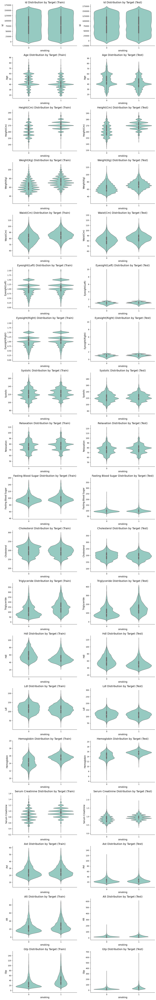

In [23]:
X_train['smoking'] = y_train
X_test['smoking'] = y_test
cont_cols = [f for f in X_train.columns if X_train[f].dtype != 'O' and X_train[f].nunique() > 2]
n_rows = len(cont_cols)
fig, axs = plt.subplots(n_rows, 2, figsize=(12, 4 * n_rows))
sns.set_palette("Set3")
for i, col in enumerate(cont_cols):
    sns.violinplot(x='smoking', y=col, data=X_train, ax=axs[i, 0])
    axs[i, 0].set_title(f'{col.title()} Distribution by Target (Train)', fontsize=14)
    axs[i, 0].set_xlabel('smoking', fontsize=12)
    axs[i, 0].set_ylabel(col.title(), fontsize=12)
    sns.despine()

    sns.violinplot(x='smoking', y=col, data=X_test, ax=axs[i, 1])
    axs[i, 1].set_title(f'{col.title()} Distribution by Target (Test)', fontsize=14)
    axs[i, 1].set_xlabel('smoking', fontsize=12)
    axs[i, 1].set_ylabel(col.title(), fontsize=12)
    sns.despine()

fig.tight_layout()

plt.show()
X_train.drop(columns='smoking', inplace=True)
X_test.drop(columns='smoking', inplace=True)


<Figure size 1800x1000 with 0 Axes>

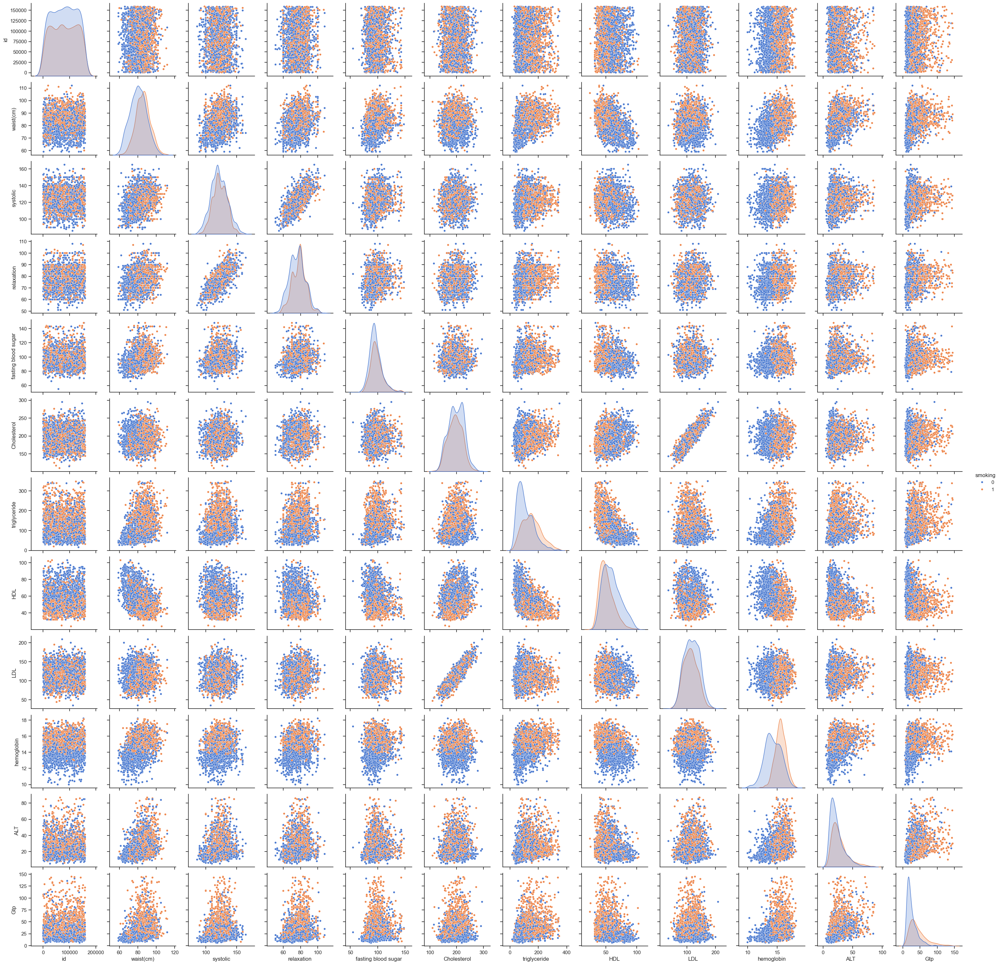

In [29]:
subsample = X_train.sample(frac=0.02, random_state=42)
pair_plot_cols=[f for f in cont_cols if subsample[f].nunique()>50]

sns.set(font_scale=1)
plt.figure(figsize=(18, 10))
sns.set(style="ticks", color_codes=True)
sns.pairplot(data=subsample, vars=pair_plot_cols,diag_kind='kde', 
        kind='scatter', palette='muted', 
        plot_kws={'s': 20}, hue='smoking')
plt.show()

<Figure size 1600x1200 with 0 Axes>

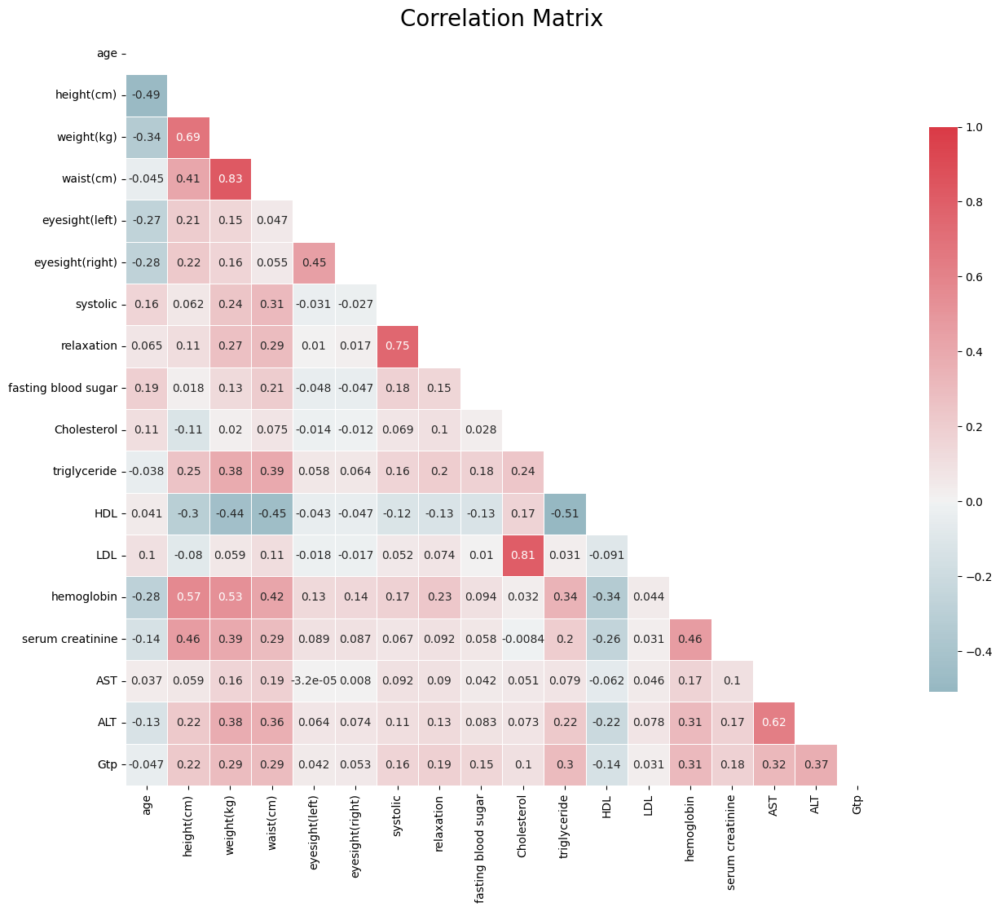

In [40]:
cat_cols = ['id','hearing(left)', 'hearing(right)', 'Urine protein', 'dental caries']
sample = df.drop(columns=[target_col] + cat_cols)
sample[sample.columns].corr()
# Plot correlation matrix
plt.figure(figsize=(16, 12))
corr_matrix = sample[sample.columns].corr()

# Mask to hide the upper triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(16, 12))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_matrix, mask=mask, cmap=cmap, vmax=1.0, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .75})

plt.title('Correlation Matrix', fontsize=20)
plt.show()

## Some features are highly correlated with each other, we will use PCA to reduce the dimensionality of the data.

In [7]:

# Standardize the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform PCA and save 85%
pca = PCA(n_components=0.85)
X_pca = pca.fit_transform(X_scaled)

# Print the number of components
print(f'Number of components: {pca.n_components_}')

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

# Fit the model
model = CatBoostClassifier()
model.fit(X_train, y_train, eval_set=(X_test, y_test), early_stopping_rounds=1000, verbose=100)
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')
print(f"AUC Score : {roc_auc_score(y_test, y_pred_proba)}")



Number of components: 14
Learning rate set to 0.104927
0:	learn: 0.6522083	test: 0.6527950	best: 0.6527950 (0)	total: 72ms	remaining: 1m 11s
100:	learn: 0.4689116	test: 0.4784511	best: 0.4784511 (100)	total: 995ms	remaining: 8.85s
200:	learn: 0.4571121	test: 0.4742598	best: 0.4742581 (199)	total: 2.29s	remaining: 9.12s
300:	learn: 0.4487275	test: 0.4729759	best: 0.4729759 (300)	total: 3.33s	remaining: 7.74s
400:	learn: 0.4416726	test: 0.4727844	best: 0.4727118 (335)	total: 4.52s	remaining: 6.75s
500:	learn: 0.4354119	test: 0.4728797	best: 0.4727118 (335)	total: 5.57s	remaining: 5.54s
600:	learn: 0.4293058	test: 0.4730624	best: 0.4726967 (529)	total: 6.51s	remaining: 4.32s
700:	learn: 0.4237044	test: 0.4732338	best: 0.4726967 (529)	total: 7.4s	remaining: 3.16s
800:	learn: 0.4180782	test: 0.4738917	best: 0.4726967 (529)	total: 8.3s	remaining: 2.06s
900:	learn: 0.4128248	test: 0.4746586	best: 0.4726967 (529)	total: 9.2s	remaining: 1.01s
999:	learn: 0.4079009	test: 0.4750828	best: 0.472696

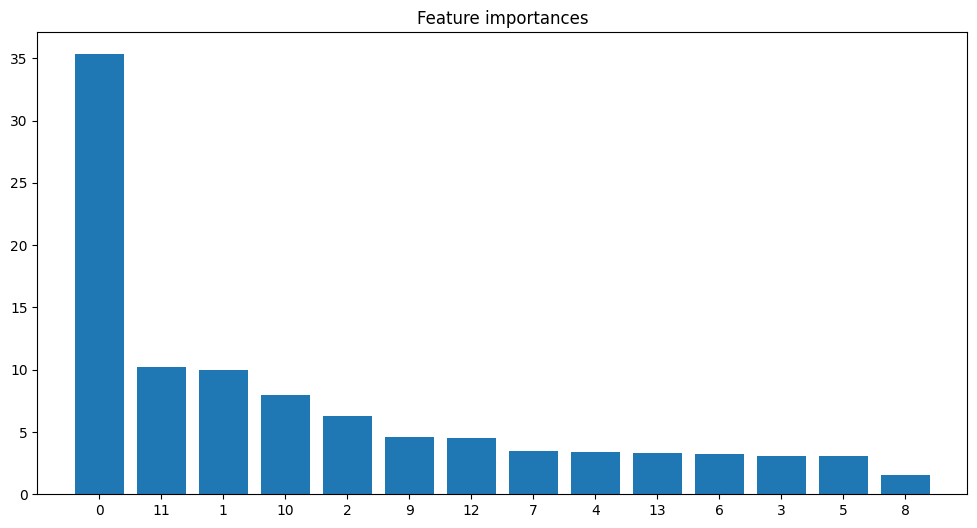

In [47]:
# Plot professional feature importance
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(12, 6))
plt.title("Feature importances")
plt.bar(range(X_train.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train.shape[1]), indices)
plt.xlim([-1, X_train.shape[1]])
plt.show()


/Users/adirserruya/Projects/ProjectsVenv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


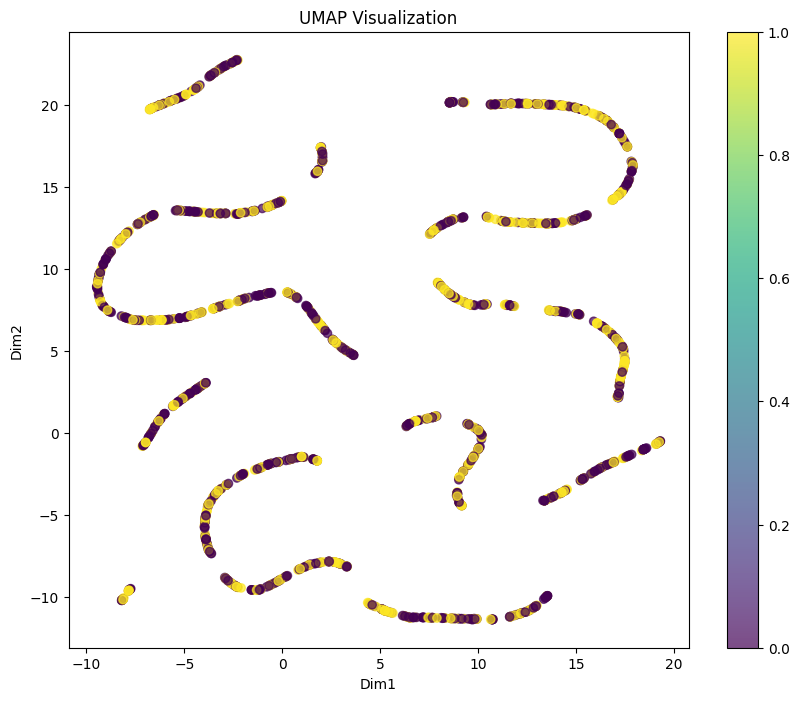

In [67]:
# Reduce dim using umap
X_sub = X.sample(2000,random_state=42)
y_sub = y.loc[X_sub.index]
X_umap = reduce_dimensionality_umap(X_sub, n_components=2, n_neighbors=15, min_dist=0.1)

# Plot the reduced data
plt.figure(figsize=(10, 8))
plt.scatter(X_umap['Dim1'], X_umap['Dim2'], c=y_sub, cmap='viridis', alpha=0.7)
plt.title('UMAP Visualization')
plt.xlabel('Dim1')
plt.ylabel('Dim2')
plt.colorbar()
plt.show()


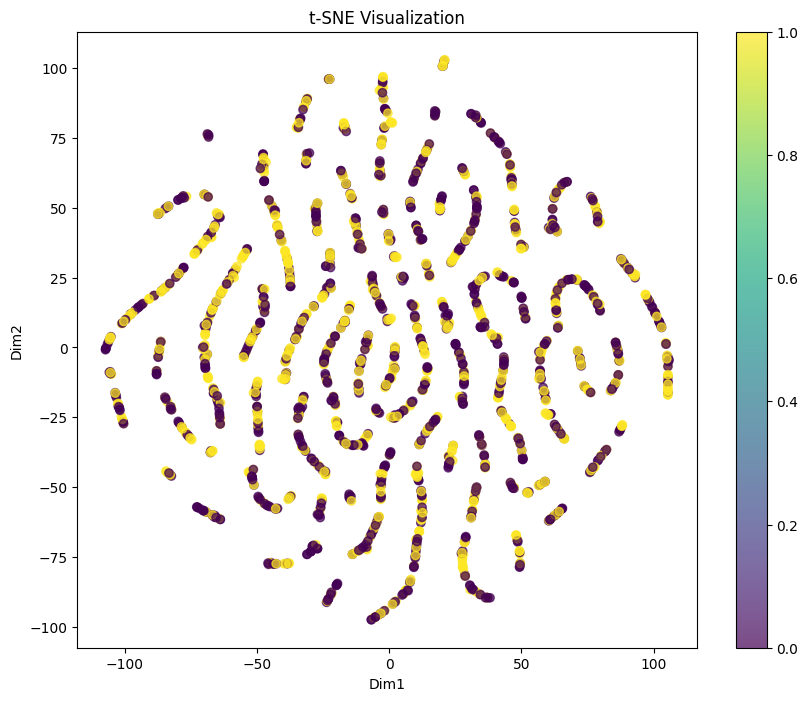

In [64]:
# Reduce dim using tsne
X_sub = X.sample(2000, random_state=42)
y_sub = y.loc[X_sub.index]
X_tsne = reduce_dimensionality_tsne(X_sub, n_components=2, perplexity=5.0)
# Perplexity is the number of nearest neighbors that is used in other manifold learning algorithms
# N-components is the number of dimensions in the embedded space

# Plot the reduced data
plt.figure(figsize=(10, 8))
plt.scatter(X_tsne['Dim1'], X_tsne['Dim2'], c=y_sub, cmap='viridis', alpha=0.7)
plt.title('t-SNE Visualization')
plt.xlabel('Dim1')
plt.ylabel('Dim2')
plt.colorbar()
plt.show()


In [65]:
# Train CB with UMAP features instead of raw features
X_umap = reduce_dimensionality_umap(X_sub, n_components=4, n_neighbors=30, min_dist=0.5)
X_train, X_test, y_train, y_test = train_test_split(X_umap, y_sub, test_size=0.2, random_state=42)

model = CatBoostClassifier(iterations=1000, learning_rate=0.1, random_strength=0.1)
model.fit(X_train, y_train, eval_set=(X_test, y_test), early_stopping_rounds=100, verbose=50)

y_pred = model.predict(X_test)
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

/Users/adirserruya/Projects/ProjectsVenv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


0:	learn: 0.6899959	test: 0.6921339	best: 0.6921339 (0)	total: 6.11ms	remaining: 6.1s
50:	learn: 0.6201415	test: 0.7078508	best: 0.6913771 (6)	total: 43.5ms	remaining: 809ms
100:	learn: 0.5763653	test: 0.7326438	best: 0.6913771 (6)	total: 79.2ms	remaining: 705ms
Stopped by overfitting detector  (100 iterations wait)

bestTest = 0.6913770614
bestIteration = 6

Shrink model to first 7 iterations.
Accuracy: 0.5475
              precision    recall  f1-score   support

           0       0.56      0.87      0.68       223
           1       0.46      0.15      0.22       177

    accuracy                           0.55       400
   macro avg       0.51      0.51      0.45       400
weighted avg       0.52      0.55      0.48       400

[[193  30]
 [151  26]]


# Creating Features

In [125]:
X_train = create_extra_features(X_train)
X_test= create_extra_features(X_test)

In [12]:
X_train.describe().T.style.background_gradient(cmap='coolwarm')

,count,mean,std,min,25%,50%,75%,max
id,132214.000000,79586.002239,45984.979777,0.000000,39714.250000,79573.500000,119439.750000,159255.000000
age,132214.000000,43.700024,11.476902,20.000000,40.000000,40.000000,50.000000,85.000000
height(cm),132214.000000,165.423026,8.776676,135.000000,160.000000,165.000000,170.000000,190.000000
weight(kg),132214.000000,67.185691,12.485250,30.000000,60.000000,65.000000,75.000000,115.000000
waist(cm),132214.000000,82.859900,8.897962,51.000000,77.000000,83.000000,89.000000,118.200000
eyesight(left),132214.000000,0.925644,0.301885,0.100000,0.700000,1.000000,1.200000,2.000000
eyesight(right),132214.000000,1.086076,0.291398,0.100000,0.900000,1.000000,1.200000,2.000000
hearing(left),132214.000000,-1.000000,0.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
hearing(right),132214.000000,-1.000000,0.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
systolic,132214.000000,122.265660,12.611826,77.000000,114.000000,121.000000,130.000000,172.000000


In [126]:

X_train = generate_features(X_train)
X_test = generate_features(X_test)


Shape before generating polynomial features: (132214, 30)
Shape after generating polynomial features: (132214, 45)
Shape before generating polynomial features: (15926, 30)
Shape after generating polynomial features: (15926, 45)


In [127]:
X_train.dropna(inplace=True)
X_test.dropna(inplace=True)
y_train = y_train.loc[X_train.index]
y_test = y_test.loc[X_test.index]
X_train.drop(columns = ['id'], inplace=True)
X_test.drop(columns = ['id'], inplace=True)

# Scaling

In [128]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)


# Variance Threshold 

In [129]:
# VarianceThreshold
selector = VarianceThreshold(threshold=0.01)
X_selected = selector.fit_transform(X_train)
print(f'Number of selected features: {X_selected.shape[1]}')
selected_features = X_train.columns[selector.get_support()]
X_selected = pd.DataFrame(X_selected, columns=selected_features)

Number of selected features: 53


In [22]:
diff = set(X_train.columns) - set(selected_features)
diff

{'AST_ALT_ratio',
 'BMI',
 'BMI^2',
 'cholesterol_ratio',
 'hearing(left)',
 'hearing(right)',
 'lipid_ratio',
 'log_LDL'}

# Feature Selection using Minimal Redundancy Maximal Relevance (mRMR)

In [21]:
X_selected

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,height(cm)_x_weight(kg),height(cm)_x_waist(cm),height(cm)_x_BMI,weight(kg)_x_waist(cm),weight(kg)_x_BMI,waist(cm)_x_BMI,age^2,age height(cm),age weight(kg),age waist(cm),age BMI,height(cm)^2,height(cm) weight(kg),height(cm) waist(cm),height(cm) BMI,weight(kg)^2,weight(kg) waist(cm),weight(kg) BMI,waist(cm)^2,waist(cm) BMI,weight_height_ratio,waist_height_ratio,BMI_age_ratio,log_systolic,log_relaxation,log_Cholesterol,log_triglyceride,log_Gtp,mean_blood_metrics,std_blood_metrics,obesity_flag,low_BMI_flag,high_waist_flag
0,0.230769,0.636364,0.588235,0.446429,0.736842,0.736842,0.663158,0.676471,0.513274,0.418605,0.296875,0.683168,0.336957,0.575221,0.0,0.428571,0.196429,0.104167,0.170886,1.0,0.554427,0.423229,0.542130,0.400676,0.397658,0.335439,0.120879,0.258772,0.287879,0.223307,0.258598,0.597203,0.554427,0.423229,0.542130,0.446247,0.400676,0.397658,0.348278,0.335439,0.542130,0.372825,0.378339,0.743239,0.764829,0.566128,0.692414,0.553236,0.540268,0.288883,0.0,0.0,0.0
1,0.461538,0.545455,0.235294,0.312500,0.368421,0.473684,0.347368,0.426471,0.424779,0.623256,0.226562,0.594059,0.663043,0.424779,0.0,0.500000,0.214286,0.177083,0.101266,0.0,0.243832,0.282153,0.221247,0.157227,0.120967,0.125601,0.307692,0.460526,0.242424,0.322917,0.238701,0.503497,0.243832,0.282153,0.221247,0.129817,0.157227,0.120967,0.227172,0.125601,0.221247,0.288092,0.121606,0.442919,0.540229,0.745811,0.626789,0.434830,0.496644,0.576260,0.0,1.0,0.0
2,0.307692,0.636364,0.470588,0.491071,0.578947,0.578947,0.368421,0.411765,0.336283,0.441860,0.265625,0.376238,0.543478,0.575221,0.0,0.642857,0.482143,0.437500,0.278481,0.0,0.455733,0.461297,0.429480,0.349958,0.286869,0.288081,0.175824,0.333333,0.287879,0.291667,0.258598,0.597203,0.455733,0.461297,0.429480,0.324544,0.349958,0.286869,0.391812,0.288081,0.429480,0.410108,0.265991,0.465336,0.525452,0.588618,0.665232,0.671360,0.335570,0.398754,0.0,0.0,0.0
3,0.615385,0.363636,0.235294,0.342262,0.210526,0.368421,0.631579,0.838235,0.371681,0.539535,0.197917,0.633663,0.543478,0.336283,0.0,0.357143,0.250000,0.281250,0.158228,0.0,0.214804,0.251549,0.258687,0.165680,0.147074,0.175272,0.468864,0.552632,0.318182,0.432292,0.368670,0.324476,0.214804,0.251549,0.258687,0.129817,0.165680,0.147074,0.252853,0.175272,0.258687,0.374830,0.109212,0.716241,0.888767,0.676937,0.594565,0.535217,0.600671,0.421881,0.0,0.0,0.0
4,0.230769,0.727273,0.764706,0.684524,0.578947,0.736842,0.484211,0.485294,0.389381,0.567442,0.250000,0.346535,0.717391,0.637168,0.0,0.571429,0.482143,0.552083,0.196203,0.0,0.730044,0.662462,0.680530,0.631868,0.553993,0.510346,0.120879,0.274123,0.367424,0.296224,0.304562,0.693706,0.730044,0.662462,0.680530,0.659229,0.631868,0.553993,0.598756,0.510346,0.680530,0.537223,0.436155,0.581952,0.597405,0.700536,0.650518,0.586025,0.500000,0.505436,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132209,0.153846,0.818182,0.588235,0.550595,0.578947,0.578947,0.347368,0.529412,0.451327,0.623256,0.510417,0.326733,0.690217,0.548673,0.0,0.571429,0.607143,0.895833,0.392405,0.0,0.600871,0.577741,0.492063,0.448014,0.346595,0.319614,0.073260,0.210526,0.227273,0.197917,0.168870,0.793007,0.600871,0.577741,0.492063,0.446247,0.448014,0.346595,0.452321,0.319614,0.492063,0.399061,0.397819,0.442919,0.638395,0.745811,0.827675,0.757398,0.530201,0.552936,0.0,0.0,0.0
132210,0.307692,0.545455,0.411765,0.416667,0.578947,0.736842,0.694737,0.750000,0.442478,0.362791,0.385417,0.386139,0.402174,0.601770,0.0,0.500000,0.303571,0.260417,0.316456,1.0,0.387518,0.368366,0.395343,0.286982,0.256213,0.254214,0.175824,0.315789,0.257576,0.265625,0.253148,0.503497,0.387518,0.368366,0.395343,0.269777,

In [20]:
y_train.shape

(132214,)

In [130]:
from mrmr import mrmr_classif
res = mrmr_classif(X_selected.reset_index(drop=True), y_train.reset_index(drop=True), K=30,return_scores=True)
res[0]

100%|██████████| 30/30 [00:05<00:00,  5.06it/s]


['hemoglobin',
 'log_Gtp',
 'height(cm)',
 'height(cm)^2',
 'log_triglyceride',
 'Gtp',
 'height(cm)_x_weight(kg)',
 'triglyceride',
 'height(cm) weight(kg)',
 'height(cm)_x_waist(cm)',
 'height(cm) waist(cm)',
 'serum creatinine',
 'weight(kg)',
 'HDL',
 'age^2',
 'weight(kg)^2',
 'weight(kg)_x_waist(cm)',
 'weight(kg) waist(cm)',
 'dental caries',
 'age',
 'weight_height_ratio',
 'height(cm)_x_BMI',
 'height(cm) BMI',
 'waist(cm)',
 'eyesight(right)',
 'waist(cm)^2',
 'std_blood_metrics',
 'weight(kg)_x_BMI',
 'weight(kg) BMI',
 'ALT']

In [131]:
X_train_minimized = X_selected[res[0]]
X_test_minimized = X_test[res[0]]


# Optuna for HPO

In [ ]:
import optuna
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, confusion_matrix
from sklearn.model_selection import train_test_split

# Objective function for Optuna
def objective(trial):
    # Suggest hyperparameters
    n_estimators = trial.suggest_int("n_estimators", 50, 1500)
    max_depth = trial.suggest_int("max_depth", 3, 15)
    learning_rate = trial.suggest_float("learning_rate", 0.01, 0.3, log=True)
    subsample = trial.suggest_float("subsample", 0.5, 1.0)
    colsample_bytree = trial.suggest_float("colsample_bytree", 0.5, 1.0)
    colsample_bylevel = trial.suggest_float("colsample_bylevel", 0.5, 1.0)
    reg_lambda = trial.suggest_float("reg_lambda", 1e-3, 10.0, log=True)
    reg_alpha = trial.suggest_float("reg_alpha", 1e-3, 10.0, log=True)
    
    # Define the model
    model = XGBClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        learning_rate=learning_rate,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        colsample_bylevel=colsample_bylevel,
        reg_lambda=reg_lambda,
        reg_alpha=reg_alpha,
        random_state=42,
        eval_metric="logloss",
    )
    
    # Train the model
    model.fit(X_train, y_train)
    
    # Predict on the test set
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    
    # Return the AUC score
    return roc_auc_score(y_test, y_pred_proba)

# # Create a study object
storage = f"sqlite:///optuna_study.db"
study = optuna.create_study(direction="maximize", study_name="XGBoost", storage=storage, load_if_exists=True)
study.optimize(objective, n_trials=100)

# Get the best hyperparameters
best_params = study.best_params
print("Best Hyperparameters: ", best_params)

# Train the final model using the best hyperparameters
best_model = XGBClassifier(
    n_estimators=1100,#best_params["n_estimators"],
    max_depth=best_params["max_depth"],
    learning_rate=best_params["learning_rate"],
    subsample=best_params["subsample"],
    colsample_bytree=best_params["colsample_bytree"],
    colsample_bylevel=best_params["colsample_bylevel"],
    reg_lambda=best_params["reg_lambda"],
    reg_alpha=best_params["reg_alpha"],
    random_state=42,
    use_label_encoder=False,
    eval_metric="logloss",
)

# Train and evaluate the best model
best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]

# Evaluate performance
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
auc_score = roc_auc_score(y_test, y_pred_proba)
print(f"AUC Score: {auc_score}")

# Fit best model on the entire dataset
X_total = pd.concat([X_train, X_test], axis=0)
y_total = pd.concat([y_train, y_test], axis=0)
best_model.fit(X_total, y_total)


In [38]:
indices = study.trials_dataframe()['value'].sort_values(ascending=False).index[:20]
params = study.trials_dataframe().loc[indices]

In [ ]:
# XGB with LR at the leaves
from xgboost import XGBClassifier
model = XGBClassifier(
    n_estimators=1000,
    max_depth=5,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    reg_lambda=1.0,
    reg_alpha=1.0,
    random_state=42,
    use_label_encoder=False,
    eval_metric="logloss",
)

model.fit(X_train, y_train, eval_set=[(X_test, y_test)], early_stopping_rounds=100, verbose=100)



In [152]:
def train_top_k(params_df):
    xgbs = {}
    for i, row in params_df.iterrows():
        print(f"Training model {i+1}/{len(params)}")
        print(row)
        xgb = XGBClassifier(
            n_estimators=int(row['params_n_estimators']),
            max_depth=int(row['params_max_depth']),
            learning_rate=row['params_learning_rate'],
            subsample=row['params_subsample'],
            colsample_bytree=row['params_colsample_bytree'],
            colsample_bylevel=row['params_colsample_bylevel'],
            reg_lambda=row['params_reg_lambda'],
            reg_alpha=row['params_reg_alpha'],
            random_state=42,
            use_label_encoder=False,
            eval_metric="logloss",
        )
        # Set sample weight based on frequency of class

        weights = y_train.value_counts(normalize=True)
        sample_weight = y_train.map(weights)
        xgb.fit(X_train_minimized, y_train, sample_weight=sample_weight)
        xgbs[i] = xgb
    return xgbs

xgbs = train_top_k(params)

Training model 1234/20
number                                            1233
value                                          0.86779
datetime_start              2024-12-30 01:52:29.829052
datetime_complete           2024-12-30 01:52:36.405522
duration                        0 days 00:00:06.576470
params_colsample_bylevel                       0.98865
params_colsample_bytree                       0.506761
params_learning_rate                          0.109871
params_max_depth                                   5.0
params_n_estimators                              999.0
params_reg_alpha                              8.575506
params_reg_lambda                              0.09004
params_subsample                              0.991448
state                                         COMPLETE
Name: 1233, dtype: object
Training model 1194/20
number                                            1193
value                                         0.867448
datetime_start              2024-12-30 01:48:40.

In [156]:
study.trials_dataframe().sort_values('value', ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_colsample_bylevel,params_colsample_bytree,params_learning_rate,params_max_depth,params_n_estimators,params_reg_alpha,params_reg_lambda,params_subsample,state
1233,1233,0.867790,2024-12-30 01:52:29.829052,2024-12-30 01:52:36.405522,0 days 00:00:06.576470,0.988650,0.506761,0.109871,5.0,999.0,8.575506,0.090040,0.991448,COMPLETE
1193,1193,0.867448,2024-12-30 01:48:40.829194,2024-12-30 01:48:46.240746,0 days 00:00:05.411552,0.923998,0.521901,0.121749,4.0,943.0,6.634865,0.143432,0.975641,COMPLETE
1452,1452,0.867433,2024-12-30 02:16:23.259939,2024-12-30 02:16:28.830836,0 days 00:00:05.570897,0.983876,0.508528,0.111149,4.0,999.0,5.601674,0.074285,0.969338,COMPLETE
727,727,0.867426,2024-12-30 00:59:52.814043,2024-12-30 00:59:58.875061,0 days 00:00:06.061018,0.990139,0.544400,0.090580,5.0,913.0,8.396683,0.494995,0.964183,COMPLETE
2529,2529,0.867394,2025-01-01 21:49:23.490787,2025-01-01 21:49:28.083031,0 days 00:00:04.592244,0.999919,0.557417,0.115686,4.0,984.0,8.508692,0.054367,0.990667,COMPLETE
774,774,0.867370,2024-12-30 01:04:25.906870,2024-12-30 01:04:32.273000,0 days 00:00:06.366130,0.928735,0.511942,0.107584,5.0,965.0,9.956306,0.173459,0.967824,COMPLETE
1868,1868,0.867364,2024-12-30 03:03:10.447311,2024-12-30 03:03:17.214247,0 days 00:00:06.766936,0.946615,0.542731,0.093401,5.0,969.0,9.985328,0.216090,0.966601,COMPLETE
580,580,0.867324,2024-12-30 00:43:32.461897,2024-12-30 00:43:39.179499,0 days 00:00:06.717602,0.965477,0.526665,0.092130,5.0,1000.0,7.554181,0.211639,0.942408,COMPLETE
851,851,0.867308,2024-12-30 01:12:48.170640,2024-12-30 01:12:53.288042,0 days 00:00:05.117402,0.916823,0.520653,0.147869,4.0,904.0,8.394284,0.137319,0.988587,COMPLETE
1247,1247,0.867294,2024-12-30 01:54:22.204426,2024-12-30 01:54:28.827962,0 days 00:00:06.623536,0.999736,0.500603,0.102378,5.0,987.0,9.905890,0.128944,0.982560,COMPLETE


In [195]:

y_test.reset_index(drop=True, inplace=True)

X_calibration, X_test_2, y_calibration, y_test_2 = train_test_split(X_test_minimized, y_test, test_size=0.5, random_state=42)
#test roc on calib for all xgbs together as an ensemble
new_data = {}
y_pred_proba = np.zeros((len(y_test_2), len(xgbs)))
for i, xgb in enumerate(xgbs.items()):
    y_pred_proba[:, i] = xgb[1].predict_proba(X_calibration)[:, 1]
    print(f"Model {i+1} AUC: {roc_auc_score(y_calibration, y_pred_proba[:, i])}")
    new_data[f"Model_{i+1}"] = y_pred_proba[:, i]

new_data = pd.DataFrame(new_data)
X_calibration = pd.concat([X_calibration.reset_index(drop=True), new_data], axis=1)


final_xgb = XGBClassifier(
    n_estimators=20,#best_params["n_estimators"],
    max_depth=5,
    learning_rate=0.01,
)
final_xgb.fit(X_calibration, y_calibration)


new_data = {}
y_pred_proba = np.zeros((len(X_test_2), len(xgbs)))
for i, xgb in enumerate(xgbs.items()):
    new_data[f"Model_{i+1}"] = xgb[1].predict_proba(X_test_2)[:, 1]

new_data = pd.DataFrame(new_data)
X_test_2 = pd.concat([X_test_2.reset_index(drop=True), new_data], axis=1)

y_pred = final_xgb.predict(X_test_2)
y_pred_proba = final_xgb.predict_proba(X_test_2)[:, 1]
print(roc_auc_score(y_test_2, y_pred_proba))

Model 1 AUC: 0.8640333825728458
Model 2 AUC: 0.8645130488545768
Model 3 AUC: 0.8644354924648451
Model 4 AUC: 0.8648752132081122
Model 5 AUC: 0.8644577199662321
Model 6 AUC: 0.8642560093888965
Model 7 AUC: 0.8651051639059151
Model 8 AUC: 0.8646598463097805
Model 9 AUC: 0.8635108603891597
Model 10 AUC: 0.86462252329666
Model 11 AUC: 0.8643218283786154
Model 12 AUC: 0.8644178703738173
Model 13 AUC: 0.8641994971659456
Model 14 AUC: 0.8649152546926255
Model 15 AUC: 0.864529711485113
Model 16 AUC: 0.86457157594456
Model 17 AUC: 0.864172152541937
Model 18 AUC: 0.8648976006195812
Model 19 AUC: 0.8643243229758932
Model 20 AUC: 0.8641573448683512
0.8529309553572432


<Figure size 2000x2000 with 0 Axes>

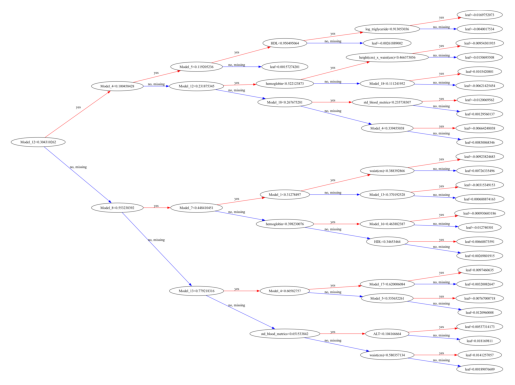

In [196]:
# Visualize tree
from xgboost import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 20))
plot_tree(final_xgb, num_trees=0, rankdir='LR')
plt.show()


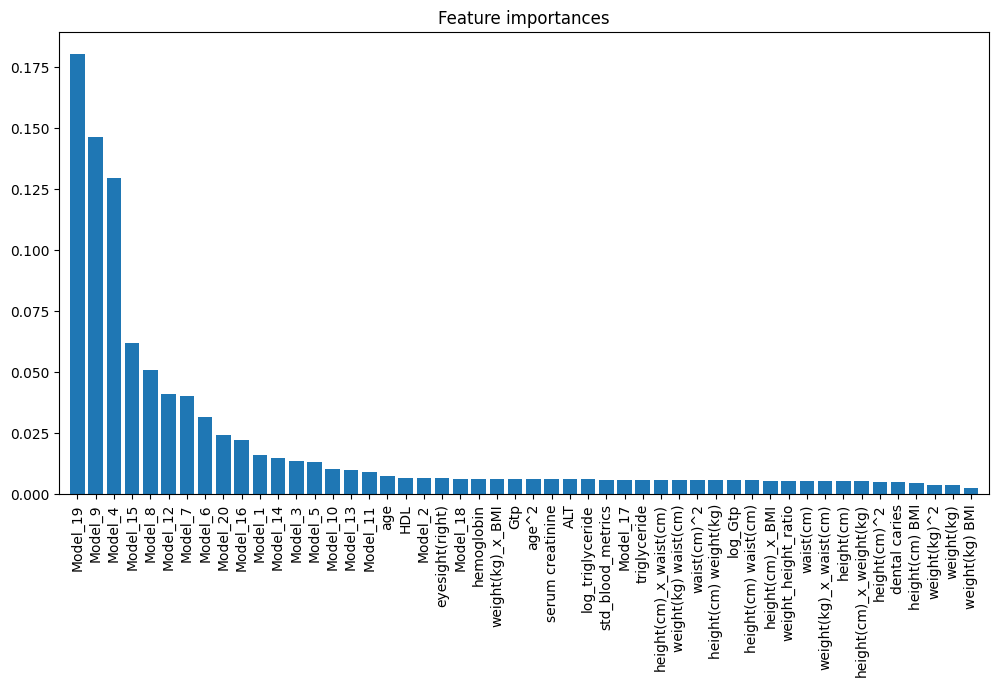

In [163]:
# Plot feature importance
importances = final_xgb.feature_importances_
features = X_calibration.columns
indices = np.argsort(importances)[::-1]
# With features names
plt.figure(figsize=(12, 6))
plt.title("Feature importances")
plt.bar(range(X_calibration.shape[1]), importances[indices], align="center")
plt.xticks(range(X_calibration.shape[1]), [features[i] for i in indices])
plt.xlim([-1, X_calibration.shape[1]])
plt.xticks(rotation=90)
plt.show()


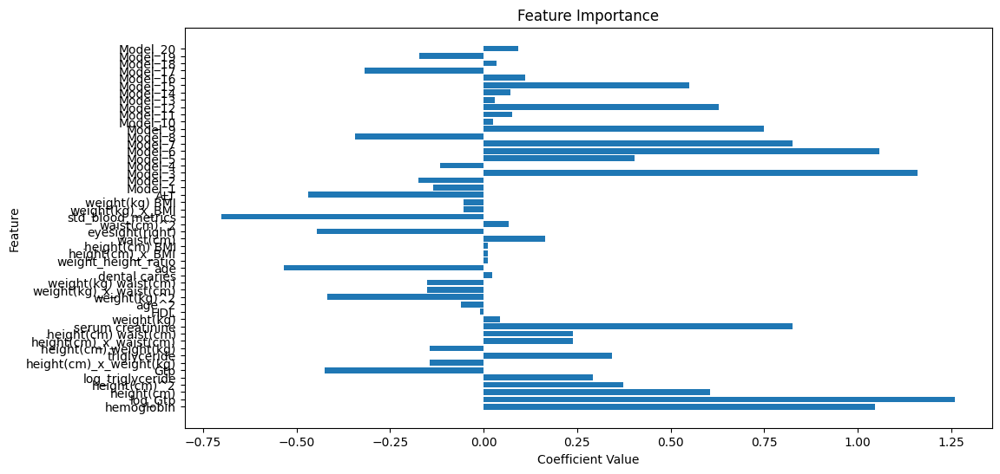

In [143]:
# plot logistic linear coefs
plt.figure(figsize=(12, 6))
plt.barh(X_test_2.columns, final_xgb.coef_[0])
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()


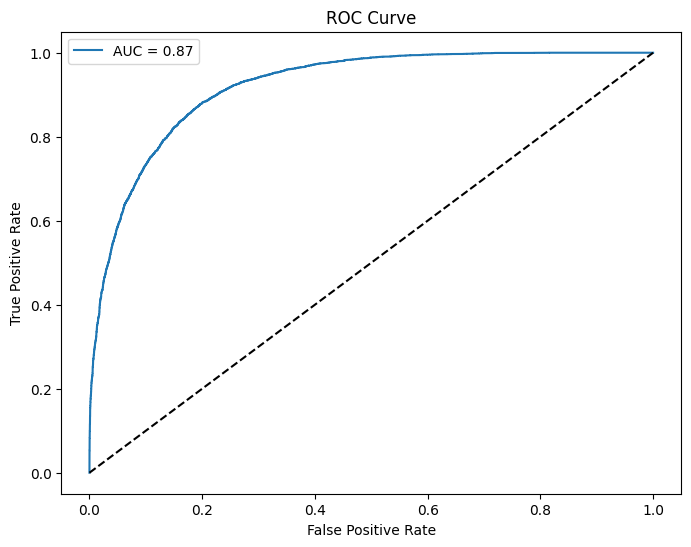

In [166]:
# AUC ROC Plot
from sklearn.metrics import roc_curve
y_pred_proba = best_model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, label=f'AUC = {auc_score:.2f}')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# Generating Preds for submission

In [113]:
test = pd.read_csv(r'/Users/adirserruya/Projects/MLCourse/HW2-Kaggle/quitting-smoking-bgu-2025/test.csv')
ids = test['id']
test = create_extra_features(test)
test = generate_features(test)
# test.set_index('id', inplace=True)
test = test[X_train.columns]
test = pd.DataFrame(scaler.transform(test), columns=test.columns)

Shape before generating polynomial features: (106171, 30)
Shape after generating polynomial features: (106171, 45)


In [162]:

test

test['smoking'] = best_model.predict_proba(test)[:,1]
test['id'] = ids
# Add current_date to the submission
dt_now = pd.Timestamp.now()
test[['id', 'smoking']].to_csv(f'submission_{dt_now.strftime("%Y-%m-%d_%H-%M-%S")}.csv', index=False)

Shape before generating polynomial features: (106171, 30)
Shape after generating polynomial features: (106171, 45)


In [114]:


new_data = {}
y_pred_proba = np.zeros((len(test), len(xgbs)))
for i, xgb in enumerate(xgbs.items()):

    new_data[f"Model_{i+1}"] = xgb[1].predict_proba(test)[:, 1]

new_data = pd.DataFrame(new_data)
test = pd.concat([test, new_data], axis=1)

y_pred = final_xgb.predict(test)
y_pred_proba = final_xgb.predict_proba(test)[:, 1]
test['smoking'] = y_pred_proba
test['id'] = ids
dt_now = pd.Timestamp.now()
test[['id', 'smoking']].to_csv(f'submission_{dt_now.strftime("%Y-%m-%d_%H-%M-%S")}.csv', index=False)

# Shap Analysis

In [107]:
# Explain the model using SHAP
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test)  # SHAP values for the test set


In [108]:
X_test.sample(3).index

Index([10878, 13564, 3959], dtype='int64')

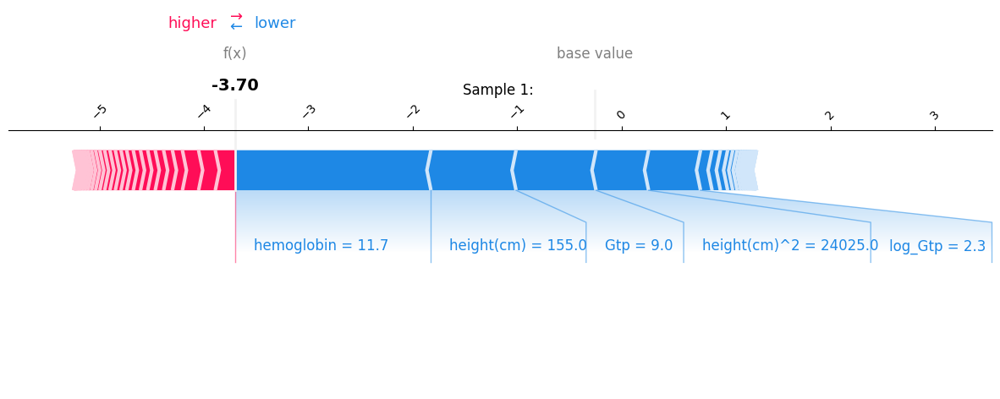

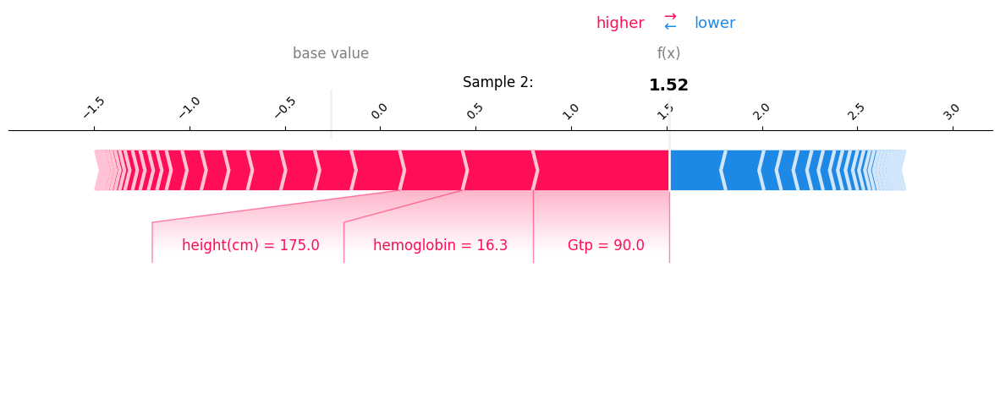

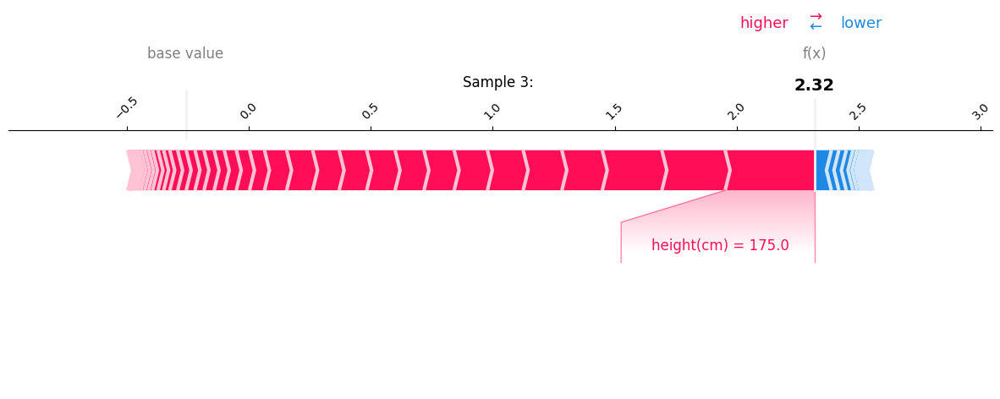

In [ ]:


# Select three samples to explain
sample_indices = [10878, 13564, 3959]  # Replace with indices of your choice
for i, sample_index in enumerate(sample_indices):
    shap.force_plot(
        explainer.expected_value,
        shap_values[sample_index],
        pd.DataFrame(scaler.inverse_transform(X_test.iloc[sample_index:sample_index + 1]), columns=X_test.columns).round(2),
        matplotlib=True,
        figsize=(15, 4),
        show=False,
        contribution_threshold=0.1,
    )
    plt.title(f'Sample {i + 1}: ')
    plt.xticks(rotation=45)
    plt.yticks(rotation = 45)
    # Rotate shap values for better readability
    
    plt.show()


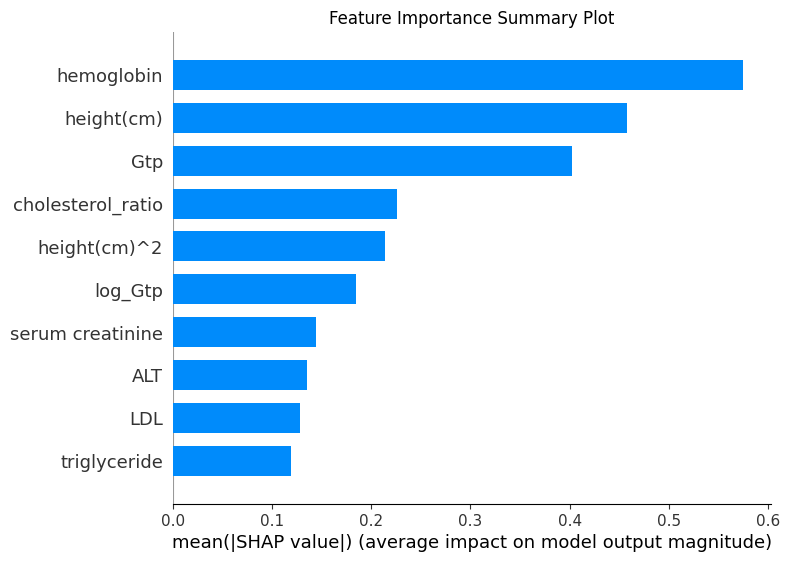

In [131]:
# Summary plot for feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar", max_display=10, show = False)
plt.title("Feature Importance Summary Plot")
plt.show()


Feature: height(cm)^2


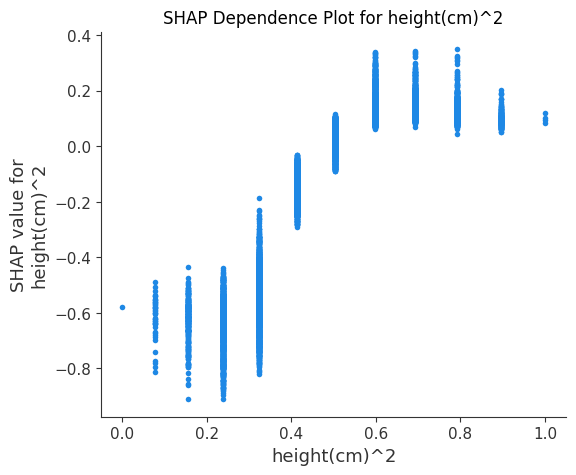

Feature: cholesterol_ratio


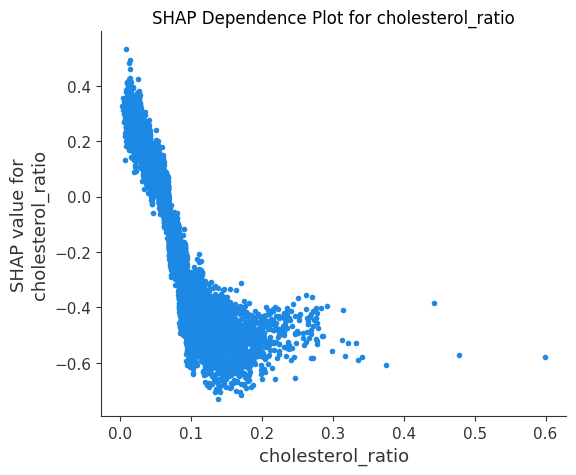

Feature: Gtp


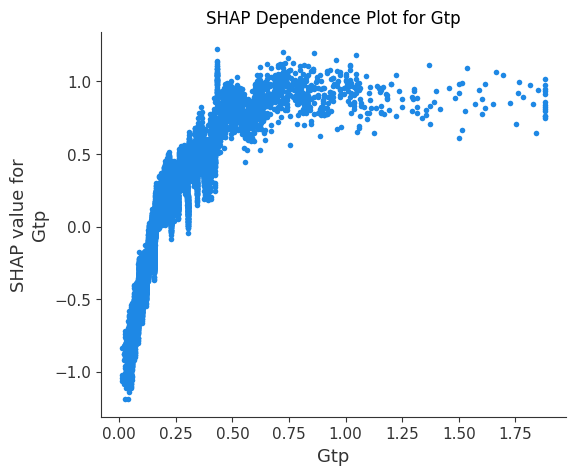

Feature: height(cm)


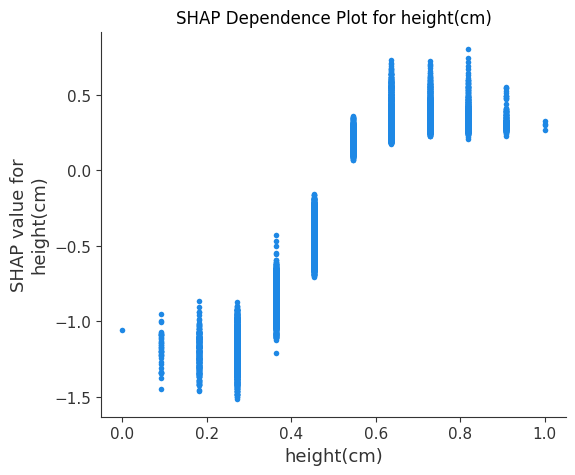

Feature: hemoglobin


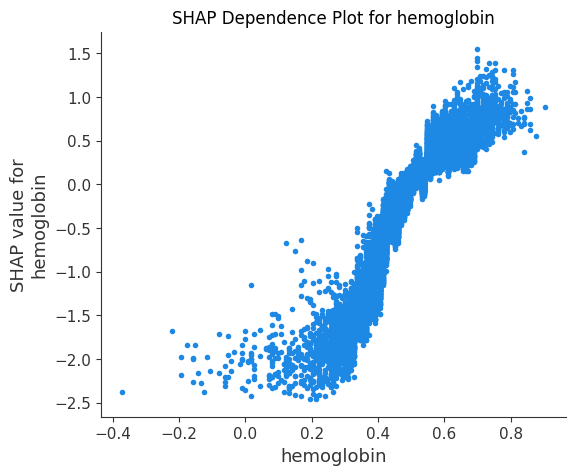

In [138]:
# Top 5 features based on SHAP summary plot
top_features = np.argsort(np.abs(shap_values).mean(axis=0))[-5:]

for feature_idx in top_features:
    feature_name = X_test.columns[feature_idx]
    print(f"Feature: {feature_name}")

    shap.dependence_plot(feature_name, shap_values, X_test,show=False,interaction_index=None)
    plt.title(f"SHAP Dependence Plot for {feature_name}")
    plt.show()


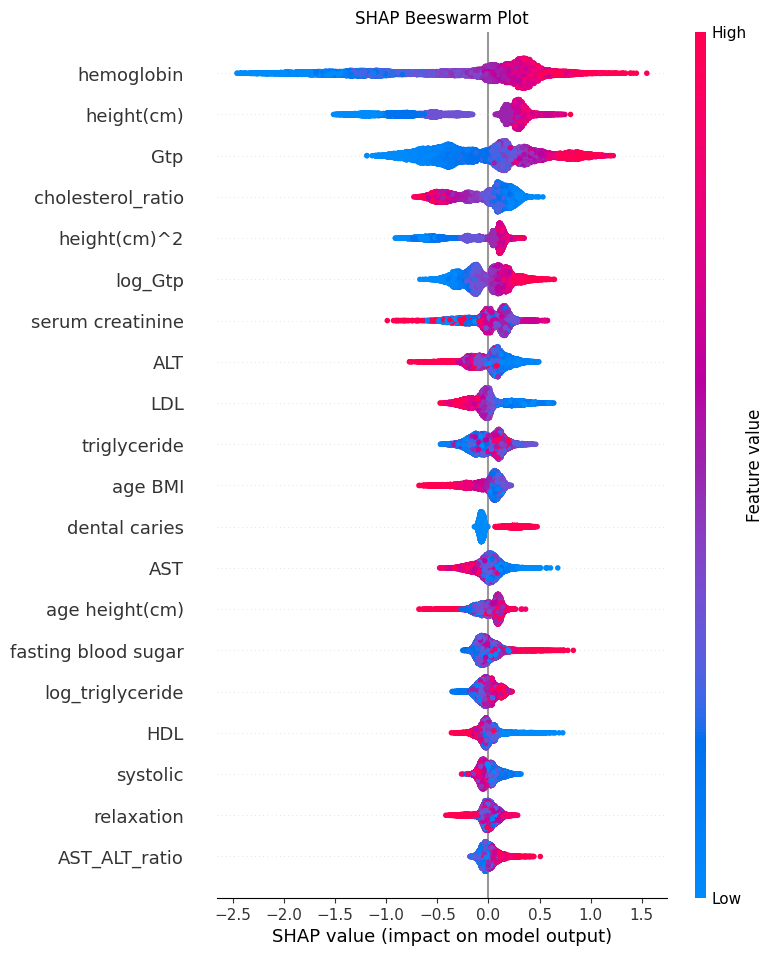

In [135]:
# SHAP Beeswarm Plot
shap.summary_plot(shap_values, X_test,show=False)
plt.title("SHAP Beeswarm Plot")
plt.show()


In [ ]:
# Bee swarm plot for the top 5 features
top_features = np.argsort(np.abs(shap_values).mean(axis=0))[-5:]


## From this part, this is just more exploratory experimentation 🚀

<span style="color:red;">**Note:** The following sections involve experimental analysis and may contain exploratory data visualizations and model evaluations. Proceed with curiosity! 🔍</span>

Accuracy: 0.767578125
              precision    recall  f1-score   support

           0       0.81      0.76      0.78       841
           1       0.73      0.78      0.75       695

    accuracy                           0.77      1536
   macro avg       0.77      0.77      0.77      1536
weighted avg       0.77      0.77      0.77      1536



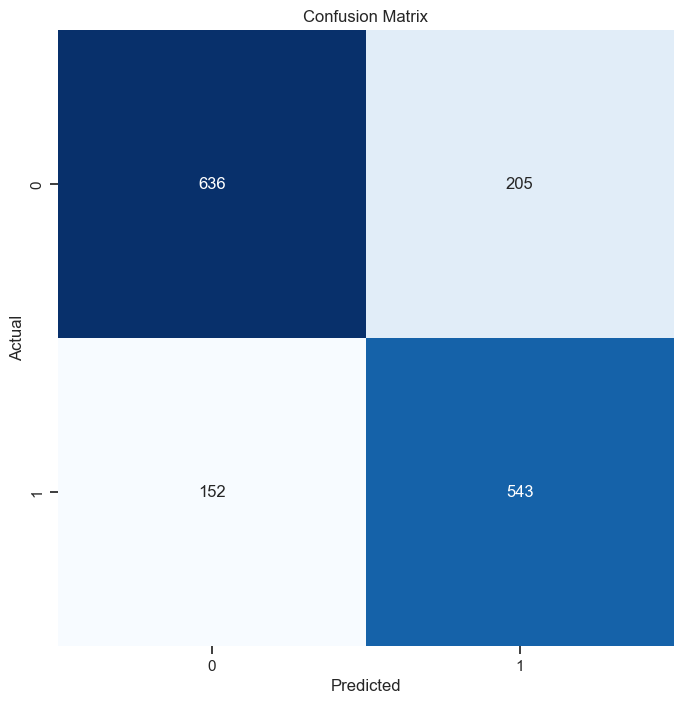

AUC Score : 0.8424178136682093


In [ ]:
# Random forest classifier
model = RandomForestClassifier(n_estimators=500, random_state=42,)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:, 1]
print(f'Accuracy: {accuracy_score(y_test, y_pred)}')
print(classification_report(y_test, y_pred))
plot_confusion_matrix(model, X_test, y_test)
print(f"AUC Score : {roc_auc_score(y_test, y_pred_proba)}")   

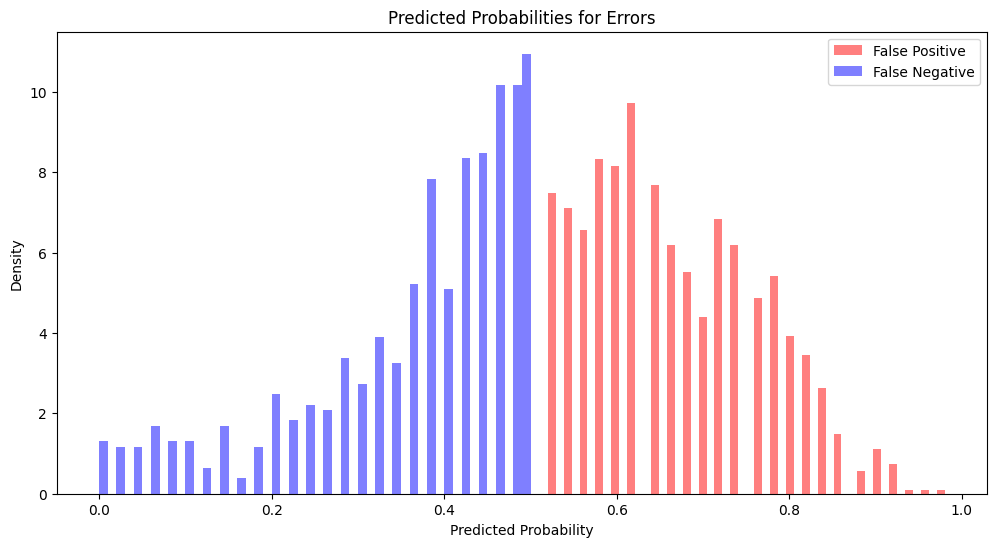

In [127]:
# Plot the dist of probabilities where i make errors of type 1 and 2
y_pred = model.predict(X_test)
y_pred_proba = model.predict_proba(X_test)[:,1]
y_true = y_test
# False positive
fp_indices = np.where((y_pred == 1) & (y_true == 0))[0]
# False negative
fn_indices = np.where((y_pred == 0) & (y_true == 1))[0]

plt.figure(figsize=(12, 6))
plt.hist(y_pred_proba[fp_indices], bins=50, color='red', alpha=0.5, label='False Positive', density=True)
plt.hist(y_pred_proba[fn_indices], bins=50, color='blue', alpha=0.5, label='False Negative', density=True)
plt.xlabel('Predicted Probability')
plt.ylabel('Density')
plt.title('Predicted Probabilities for Errors')
plt.legend()
plt.show()


# Stacking Ensemble

In [169]:


def generate_oof_predictions(
    X: pd.DataFrame,
    y: pd.Series,
    base_learners: List[BaseEstimator],
    folds: int = 5,
    random_state: int = 42
) -> Tuple[np.ndarray, List[BaseEstimator]]:
    """
    Perform K-fold training for each base learner and produce
    Out-of-Fold (OOF) predictions. This avoids overfitting when stacking.

    Args:
        X (pd.DataFrame): Training features (shape: [n_samples, n_features]).
        y (pd.Series): Training labels (binary).
        base_learners (List[BaseEstimator]): Instantiated models (not fitted).
        folds (int): Number of CV folds.
        random_state (int): Random seed.

    Returns:
        (oof_preds, refitted_base_learners)
          - oof_preds: np.ndarray of shape (n_samples, len(base_learners))
          - refitted_base_learners: each base learner retrained on ALL X,y after OOF
    """
    n_samples = len(X)
    n_learners = len(base_learners)

    # We'll store OOF preds in an array: (n_samples, n_learners)
    oof_preds = np.zeros((n_samples, n_learners))

    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=random_state)
    
    refitted_base_learners = []
    
    for learner_idx, model in enumerate(base_learners):
        print(f"\nGenerating OOF for base learner #{learner_idx+1}: {model.__class__.__name__}")

        # We store a fresh copy for cross-validation training
        # If you want different random seeds/fold-level variations, handle that outside.
        fold_no = 1
        for train_idx, valid_idx in skf.split(X, y):
            X_train_fold = X.iloc[train_idx]
            y_train_fold = y.iloc[train_idx]
            X_valid_fold = X.iloc[valid_idx]
            
            # Fit on fold
            model.fit(X_train_fold, y_train_fold)
            
            # Predict probabilities on fold's validation
            try:
                valid_pred_probs = model.predict_proba(X_valid_fold)[:, 1]
            except AttributeError:
                # If model doesn't have predict_proba, do a fallback
                # For GMM, e.g., we can approximate class=1 vs class=0
                # We'll make a small helper:
                valid_pred_probs = gmm_proba(model, X_valid_fold)

            # Store in OOF array
            oof_preds[valid_idx, learner_idx] = valid_pred_probs
            
            print(f"  Fold {fold_no} done.")
            fold_no += 1

        # After CV, retrain the model on the entire dataset
        model.fit(X, y)
        refitted_base_learners.append(model)
    
    return oof_preds, refitted_base_learners

def gmm_proba(gmm: GMM, X_valid_fold: pd.DataFrame) -> np.ndarray:
    """
    Approximate binary "probability" from a 2-component GMM.
    We'll label whichever component has higher mean in some dimension as 'class=1'.
    Or do something more advanced, like comparing the posterior of the 2 components.
    """
    # We'll get posterior probabilities for each component
    # shape: (n_samples, n_components)
    posterior = gmm.predict_proba(X_valid_fold)
    
    # We need to decide which component is "class 1"
    # Simplest approach: check which component has the bigger mean along dimension 0
    # or which means are bigger in general. Let's do an arbitrary approach:
    # We'll assume component 1 is the "higher label" if its overall mean is bigger
    # This is naive, but a demonstration:
    means = gmm.means_.mean(axis=1)  # average across features => shape: (n_components,)
    if means[0] > means[1]:
        # component 0 => "class=1"
        return posterior[:, 0]
    else:
        # component 1 => "class=1"
        return posterior[:, 1]

def train_stacking_ensemble(
    X: pd.DataFrame,
    y: pd.Series,
    folds: int = 5
) -> Tuple[List[BaseEstimator], BaseEstimator, np.ndarray]:
    """
    2-level stacking approach using OOF predictions for base learners
    plus original features for the meta-learner.
    """
    # ================
    # 1) Define 10 base learners
    # ================
    base_learners = [
        RandomForestClassifier(n_estimators=100, max_depth=8, random_state=0),
        LGBMClassifier(n_estimators=200, random_state=0),
        CatBoostClassifier(iterations=200, verbose=False, random_state=0),
        XGBClassifier(n_estimators=200, use_label_encoder=False, eval_metric='logloss', random_state=0),
        LogisticRegression(max_iter=1000, random_state=0),
        GMM(n_components=5, random_state=0),
        KNeighborsClassifier(n_neighbors=15),
        ExtraTreesClassifier(n_estimators=100, max_depth=8, random_state=0),
        DecisionTreeClassifier(max_depth=10, random_state=0),
    ]
    
    # 2) Generate OOF predictions for each base learner
    oof_preds, fitted_base_learners = generate_oof_predictions(X, y, base_learners, folds=folds)
    print("OOF shape:", oof_preds.shape)  # (n_samples, 10)

    # 3) Prepare meta-features = [oof_preds, original X features]
    # shape => (n_samples, 10 + n_features)
    meta_features = np.hstack([oof_preds, X.values])

    # 4) Train meta-learner (CatBoost or any other)
    # If you want a simpler meta-learner, do LogisticRegression, e.g.
    meta_learner = LogisticRegression()
    meta_learner.fit(meta_features, y)

    # Evaluate meta-learner performance on OOF as a quick check
    oof_meta_probs = meta_learner.predict_proba(meta_features)[:, 1]
    oof_auc = roc_auc_score(y, oof_meta_probs)
    print(f"\nMeta-learner OOF AUC (with features + base preds): {oof_auc:.4f}")
    
    return fitted_base_learners, meta_learner, oof_preds

def predict_stacking_ensemble(
    X_test: pd.DataFrame,
    fitted_base_learners: List[BaseEstimator],
    meta_learner: BaseEstimator
) -> np.ndarray:
    """
    Generate final predictions for new data using the stacked ensemble
    that includes original features + base predictions.

    Steps:
      1) For each base learner, get predicted proba on X_test => column in meta_features
      2) Append the original X_test features => final shape: (n_test, 10 + n_features)
      3) meta_learner.predict_proba => final probs
    """
    n_samples_test = len(X_test)
    n_learners = len(fitted_base_learners)

    # We'll form a matrix (n_samples_test, n_learners) for the base learners' predictions
    base_preds_test = np.zeros((n_samples_test, n_learners))

    for i, model in enumerate(fitted_base_learners):
        try:
            pred_probs = model.predict_proba(X_test)[:, 1]
        except AttributeError:
            # e.g. GMM
            pred_probs = gmm_proba(model, X_test)
        base_preds_test[:, i] = pred_probs

    # Combine base predictions + original features
    # shape => (n_samples_test, n_learners + n_features)
    meta_features_test = np.hstack([base_preds_test, X_test.values])

    # Final meta-learner predictions
    final_probs = meta_learner.predict_proba(meta_features_test)[:, 1]
    return final_probs



# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.02, random_state=42)
print("Training the multi-learner stacking ensemble with 10 base models...")

# Train
base_models, meta_model, oof_preds = train_stacking_ensemble(X_train, y_train, folds=5)

# Predict
final_probs = predict_stacking_ensemble(X_test, base_models, meta_model)

# Evaluate
test_auc = roc_auc_score(y_test, final_probs)
print(f"Test AUC of the final stacked ensemble: {test_auc:.4f}")


Training the multi-learner stacking ensemble with 10 base models...

Generating OOF for base learner #1: RandomForestClassifier
  Fold 1 done.
  Fold 2 done.
  Fold 3 done.
  Fold 4 done.
  Fold 5 done.

Generating OOF for base learner #2: LGBMClassifier
  Fold 1 done.
  Fold 2 done.
  Fold 3 done.
  Fold 4 done.
  Fold 5 done.

Generating OOF for base learner #3: CatBoostClassifier
  Fold 1 done.
  Fold 2 done.
  Fold 3 done.
  Fold 4 done.
  Fold 5 done.

Generating OOF for base learner #4: XGBClassifier


/Users/adirserruya/Projects/ProjectsVenv/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [07:51:23] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


  Fold 1 done.


/Users/adirserruya/Projects/ProjectsVenv/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [07:51:25] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


  Fold 2 done.


/Users/adirserruya/Projects/ProjectsVenv/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [07:51:27] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


  Fold 3 done.


/Users/adirserruya/Projects/ProjectsVenv/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [07:51:28] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


  Fold 4 done.


/Users/adirserruya/Projects/ProjectsVenv/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [07:51:30] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


  Fold 5 done.


/Users/adirserruya/Projects/ProjectsVenv/lib/python3.12/site-packages/xgboost/core.py:158: UserWarning: [07:51:32] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Generating OOF for base learner #5: LogisticRegression
  Fold 1 done.
  Fold 2 done.
  Fold 3 done.
  Fold 4 done.
  Fold 5 done.

Generating OOF for base learner #6: GaussianMixture
  Fold 1 done.
  Fold 2 done.
  Fold 3 done.
  Fold 4 done.
  Fold 5 done.

Generating OOF for base learner #7: KNeighborsClassifier
  Fold 1 done.
  Fold 2 done.
  Fold 3 done.
  Fold 4 done.
  Fold 5 done.

Generating OOF for base learner #8: ExtraTreesClassifier
  Fold 1 done.
  Fold 2 done.
  Fold 3 done.
  Fold 4 done.
  Fold 5 done.

Generating OOF for base learner #9: DecisionTreeClassifier
  Fold 1 done.
  Fold 2 done.
  Fold 3 done.
  Fold 4 done.
  Fold 5 done.
OOF shape: (132214, 9)


/Users/adirserruya/Projects/ProjectsVenv/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Meta-learner OOF AUC (with features + base preds): 0.8660
Test AUC of the final stacked ensemble: 0.8631


# 1D CNN - Conv1D

In [148]:

from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn as nn
import torch.optim as optim

class Tabular1DDataset(Dataset):
    """
    A simple Dataset for tabular data treated as 1D sequences.
    Each sample will be of shape (1, num_features) for a 1D CNN.
    """
    def __init__(self, X, y):
        """
        Args:
            X (pd.DataFrame or np.ndarray): Shape (num_samples, num_features)
            y (pd.Series or np.ndarray): Shape (num_samples,)
        """
        # Convert X, y to NumPy arrays if they aren't already
        if hasattr(X, "values"):
            X = X.values
        if hasattr(y, "values"):
            y = y.values

        # Create tensors
        self.X = torch.tensor(X, dtype=torch.float32)  # shape => (num_samples, num_features)
        self.y = torch.tensor(y, dtype=torch.long)      # for classification (0 or 1)

        # Reshape to (num_samples, 1, num_features) so that:
        # batch dimension = num_samples, channels=1, length=num_features
        self.X = self.X.unsqueeze(1)  # => shape (num_samples, 1, num_features)

    def __len__(self):
        return len(self.X)

    def __getitem__(self, idx):
        return self.X[idx], self.y[idx]


class Simple1DCNN(nn.Module):
    """
    A basic 1D CNN for binary classification (0/1), 
    expecting input shape (batch_size, 1, num_features).
    """
    def __init__(self, num_features: int):
        super(Simple1DCNN, self).__init__()

        # Convolution 1: in_channels=1, out_channels=16
        self.conv1 = nn.Conv1d(in_channels=1, out_channels=16, kernel_size=3, padding=1)
        self.pool = nn.MaxPool1d(kernel_size=2)

        # Convolution 2: in_channels=16, out_channels=32
        self.conv2 = nn.Conv1d(in_channels=16, out_channels=32, kernel_size=3, padding=1)

        self.conv3 = nn.Conv1d(in_channels=32, out_channels=64, kernel_size=3, padding=1)

        # We'll define a placeholder for our final fully-connected layer
        # but we can also define it statically if we know the shape.
        self.fc = None

    def forward(self, x):
        """
        x shape: (batch_size, 1, num_features)
        """
        # conv1 -> relu -> pool => shape => (batch_size, 16, num_features//2)
        x = torch.relu(self.conv1(x))
        x = self.pool(x)

        # conv2 -> relu -> pool => shape => (batch_size, 32, num_features//4)
        x = torch.relu(self.conv2(x))
        x = self.pool(x)

        x = torch.relu(self.conv3(x))
        x = self.pool(x)


        # Flatten
        batch_size, channels, seq_len = x.shape
        x = x.view(batch_size, -1)  # => shape (batch_size, 32*(num_features//4)) if it divides evenly

        # If not defined, define fc dynamically
        if self.fc is None:
            in_features = channels * seq_len
            # Output size = 2 for binary classification
            self.fc = nn.Linear(in_features, 2)
            # Move to same device if x is on GPU
            self.fc.to(x.device)

        out = self.fc(x)  # => (batch_size, 2)
        return out


def train_model(model, train_loader, val_loader=None, epochs=10, lr=1e-3, device='cpu'):
    """
    Classic training loop for classification.
    Uses CrossEntropyLoss for 2 classes (0 or 1).
    """
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    model.to(device)

    for epoch in range(1, epochs + 1):
        model.train()
        running_loss = 0.0
        for X_batch, y_batch in train_loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)

            optimizer.zero_grad()
            outputs = model(X_batch)
            loss = criterion(outputs, y_batch)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * len(X_batch)

        epoch_loss = running_loss / len(train_loader.dataset)

        if val_loader:
            val_loss, val_acc = evaluate_model(model, val_loader, device)
            print(f"Epoch {epoch}/{epochs} | "
                  f"Train Loss: {epoch_loss:.4f} | "
                  f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.4f}")
        else:
            print(f"Epoch {epoch}/{epochs} | Train Loss: {epoch_loss:.4f}")


def evaluate_model(model, data_loader, device='cpu'):
    """
    Evaluate model on a given DataLoader:
    returns (avg_loss, accuracy).
    """
    model.eval()
    criterion = nn.CrossEntropyLoss()
    running_loss = 0.0
    correct = 0
    total = 0
    auc = 0
    with torch.no_grad():
        for X_batch, y_batch in data_loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)

            outputs = model(X_batch)             # (batch_size, 2)
            loss = criterion(outputs, y_batch)

            running_loss += loss.item() * len(X_batch)
            _, preds = torch.max(outputs, dim=1)
            correct += (preds == y_batch).sum().item()
            total += len(X_batch)
            auc += roc_auc_score(y_batch.cpu().numpy(), outputs.cpu().numpy()[:, 1])

    avg_auc = auc / len(data_loader)
    print(f"AUC: {avg_auc:.4f}")
    avg_loss = running_loss / total
    accuracy = correct / total
    return avg_loss, accuracy


def compute_auc(model, data_loader, device='cpu'):
    """
    Compute ROC AUC on the data_loader by collecting predicted probabilities for class=1.
    """
    model.eval()
    all_probs = []
    all_labels = []
    with torch.no_grad():
        for X_batch, y_batch in data_loader:
            X_batch = X_batch.to(device)
            outputs = model(X_batch)       # shape => (batch_size, 2)
            probs = torch.softmax(outputs, dim=1)[:, 1]  # probability for class=1

            all_probs.append(probs.cpu().numpy())
            all_labels.append(y_batch.numpy())

    all_probs = np.concatenate(all_probs)
    all_labels = np.concatenate(all_labels)
    return roc_auc_score(all_labels, all_probs)



# Scale X's
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
# Build Datasets
train_dataset = Tabular1DDataset(X_train, y_train)
test_dataset = Tabular1DDataset(X_test, y_test)

# DataLoaders
train_loader = DataLoader(train_dataset, batch_size=4096, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=4096, shuffle=False)

# Instantiate model
model = Simple1DCNN(num_features=X_train.shape[1])
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Using device:", device)

    

Using device: cpu


In [152]:
# Train
train_model(model, train_loader, val_loader=None, epochs=40, lr=1e-3, device=device)

# Evaluate on test set
test_loss, test_acc = evaluate_model(model, test_loader, device=device)
test_auc = compute_auc(model, test_loader, device=device)

print(f"Test Loss: {test_loss:.4f}, Test Acc: {test_acc:.4f}, Test AUC: {test_auc:.4f}")


Epoch 1/40 | Train Loss: 0.4596
Epoch 2/40 | Train Loss: 0.4583
Epoch 3/40 | Train Loss: 0.4580
Epoch 4/40 | Train Loss: 0.4580
Epoch 5/40 | Train Loss: 0.4588
Epoch 6/40 | Train Loss: 0.4581
Epoch 7/40 | Train Loss: 0.4578
Epoch 8/40 | Train Loss: 0.4577
Epoch 9/40 | Train Loss: 0.4575
Epoch 10/40 | Train Loss: 0.4574
Epoch 11/40 | Train Loss: 0.4577
Epoch 12/40 | Train Loss: 0.4577
Epoch 13/40 | Train Loss: 0.4572
Epoch 14/40 | Train Loss: 0.4568
Epoch 15/40 | Train Loss: 0.4566
Epoch 16/40 | Train Loss: 0.4568
Epoch 17/40 | Train Loss: 0.4572
Epoch 18/40 | Train Loss: 0.4569
Epoch 19/40 | Train Loss: 0.4565
Epoch 20/40 | Train Loss: 0.4565
Epoch 21/40 | Train Loss: 0.4571
Epoch 22/40 | Train Loss: 0.4571
Epoch 23/40 | Train Loss: 0.4562
Epoch 24/40 | Train Loss: 0.4563
Epoch 25/40 | Train Loss: 0.4561
Epoch 26/40 | Train Loss: 0.4565
Epoch 27/40 | Train Loss: 0.4562
Epoch 28/40 | Train Loss: 0.4554
Epoch 29/40 | Train Loss: 0.4556
Epoch 30/40 | Train Loss: 0.4555
Epoch 31/40 | Train

In [153]:
# Test probas
model.eval()
all_probs = []
all_labels = []
with torch.no_grad():
    for X_batch, y_batch in test_loader:
        X_batch = X_batch.to(device)
        outputs = model(X_batch)       # shape => (batch_size, 2)
        probs = torch.softmax(outputs, dim=1)[:, 1]  # probability for class=1

        all_probs.append(probs.cpu().numpy())
        all_labels.append(y_batch.numpy())
        

In [155]:
all_probs = np.concatenate(all_probs)
all_labels = np.concatenate(all_labels)
# To DF
df = pd.DataFrame({'proba': all_probs, 'label': all_labels})

In [157]:


cb = CatBoostClassifier(iterations=1000, verbose=100
                        ,eval_metric='AUC',min_child_samples=1)
cb.fit(X_train, y_train, eval_set=(X_test, y_test), early_stopping_rounds=200, verbose=100)

Learning rate set to 0.108025
0:	test: 0.8218331	best: 0.8218331 (0)	total: 31.4ms	remaining: 31.4s
100:	test: 0.8438601	best: 0.8438601 (100)	total: 1.72s	remaining: 15.3s
200:	test: 0.8469228	best: 0.8469228 (200)	total: 3.11s	remaining: 12.4s
300:	test: 0.8480477	best: 0.8480863 (297)	total: 4.42s	remaining: 10.3s
400:	test: 0.8486626	best: 0.8487642 (381)	total: 5.63s	remaining: 8.41s
500:	test: 0.8486155	best: 0.8487898 (446)	total: 6.87s	remaining: 6.84s
600:	test: 0.8484374	best: 0.8487898 (446)	total: 8.22s	remaining: 5.46s
Stopped by overfitting detector  (200 iterations wait)

bestTest = 0.8487897718
bestIteration = 446

Shrink model to first 447 iterations.


In [158]:
cb_probas = cb.predict_proba(X_test)[:, 1]

# MERGE CB with CNN
final_probas = (cb_probas + all_probs) / 2
roc_auc_score(y_test, final_probas)


0.8483025386810876

In [136]:
# Predict
final_probs = predict_stacking_ensemble(X_test, base_models, meta_model)

# Evaluate
test_auc = roc_auc_score(y_test, final_probs)
print(f"Test AUC of the final stacked ensemble: {test_auc:.4f}")

Test AUC of the final stacked ensemble: 0.8369


# Strong Diversified Ensemble Model

In [ ]:
def compute_coverage(
    model_indices: List[int],
    models: List[ClassifierMixin],
    X_calib: pd.DataFrame,
    y_calib: np.ndarray,
    features_used: List[List[str]]
) -> float:
    """
    Compute fraction of samples correctly predicted (coverage)
    by unweighted ensemble of the given subset of models.

    Args:
        model_indices (List[int]): Indices of models in the subset.
        models (List[ClassifierMixin]): All candidate models.
        X_calib (pd.DataFrame): Calibration features.
        y_calib (np.ndarray): Calibration labels.
        features_used (List[List[str]]): For each model, which features it uses.

    Returns:
        float: Coverage = fraction of y_calib correctly predicted by the subset ensemble.
    """
    if not model_indices:
        return 0.0  # No models => coverage is 0

    # Sum predicted probabilities across the subset
    ensemble_probs = np.zeros(len(X_calib))
    for idx in model_indices:
        feats = features_used[idx]
        ensemble_probs += models[idx].predict_proba(X_calib[feats])[:, 1]

    # Average them (unweighted)
    ensemble_probs /= len(model_indices)

    return roc_auc_score(y_calib, ensemble_probs)



class POSDModel:
    def __init__(self, k=5, t=3, row_subsample=0.8, col_subsample=0.8, iterations=1000, learning_rate=0.05):
        """
        Initialize the POSDModel parameters.
        
        Args:
        k (int): Number of stratified splits for training models.
        t (int): Number of models to select for the final ensemble.
        row_subsample (float): Fraction of rows to subsample for each model.
        col_subsample (float): Fraction of columns to subsample for each model.
        iterations (int): Number of iterations for each CatBoost model.
        learning_rate (float): Learning rate for each CatBoost model.
        """
        self.k = k
        self.t = t
        self.row_subsample = row_subsample
        self.col_subsample = col_subsample
        self.iterations = iterations
        self.learning_rate = learning_rate
        self.models = []
        self.model_weights = []

    def _subsample(self, X, y):
        """Subsample rows and columns."""
        rows_ratio  = random.uniform(self.row_subsample - 0.1, self.row_subsample + 0.1)
        col_ratio = random.uniform(self.col_subsample - 0.1, self.col_subsample + 0.1)
        
        row_indices = np.random.choice(X.index, size=int(len(X) * rows_ratio), replace=False)
        col_indices = np.random.choice(X.columns, size=int(X.shape[1] * col_ratio), replace=False)
        # Create freq based sample weights
        X_sub = X.loc[row_indices, col_indices]
        y_sub = y.loc[row_indices]
        sample_weights_map = y_sub.value_counts(normalize=True)
        sample_weights = y_sub.map(sample_weights_map)
       
        return X_sub, y_sub,sample_weights

    def fit(self, X_train, y_train, calibration_data):
        """
        Train the POSDModel using K stratified splits.
        
        Args:
        X_train (pd.DataFrame): Training features.
        y_train (pd.Series): Training labels.
        calibration_data (tuple): Data for calibration (X_calib, y_calib).
        """
        X_calib, y_calib = calibration_data
        skf = StratifiedKFold(n_splits=self.k, shuffle=True, random_state=42)

        model_scores = []
        for train_index, _ in tqdm(skf.split(X_train, y_train), desc="Training models", total=self.k):
            # Stratified split and subsample
            X_split, y_split = X_train.iloc[train_index], y_train.iloc[train_index]
            X_sub, y_sub,sw = self._subsample(X_split, y_split)

            # Choose model type at random for diversity
            model_type = random.choice(["catboost", "rf", "logistic", "knn", "naivebayes","dt"])

            if model_type == "dt":
                model = DecisionTreeClassifier(
                    max_depth=random.randint(3, 10),
                    min_samples_split=random.randint(2, 10),
                    min_samples_leaf=random.randint(1, 5),
                    criterion=random.choice(["gini", "entropy"])
                )
                # Randomly use sample weights
                if random.random() < 0.5:
                    model.fit(X_sub, y_sub)
                else:
                    model.fit(X_sub, y_sub,sample_weight=sw)
                features_used = X_sub.columns.tolist()

            elif model_type == "catboost":
                # CatBoost with random hyperparams
                model = CatBoostClassifier(
                    iterations=self.iterations + random.randint(-self.iterations // 2, self.iterations // 2),
                    learning_rate=self.learning_rate + random.uniform(-0.05, 0.05),
                    depth=random.randint(3, 10),
                    l2_leaf_reg=random.randint(1, 10),
                    loss_function=random.choice(["Logloss", "CrossEntropy"]),
                    verbose=0
                )
                model.fit(X_sub, y_sub)
                # CatBoost can track its own features
                features_used = model.feature_names_

            elif model_type == "rf":
                # RandomForest with random hyperparams
                n_estimators = random.randint(50, 200)
                max_depth = random.randint(3, 10)
                model = RandomForestClassifier(
                    n_estimators=n_estimators,
                    max_depth=max_depth,
                    random_state=42
                )
                model.fit(X_sub, y_sub)
                features_used = X_sub.columns.tolist()

            elif model_type == "logistic":
                # LogisticRegression with random hyperparams
                c_val = 10 ** random.uniform(-2, 2)  # Random log-scale range
                solver_choice = random.choice(["liblinear", "lbfgs"])
                model = LogisticRegression(C=c_val, solver=solver_choice, max_iter=1000)
                model.fit(X_sub, y_sub)
                features_used = X_sub.columns.tolist()

            elif model_type == "knn":
                # KNN with random hyperparams
                n_neighbors = random.randint(3, 15)
                model = KNeighborsClassifier(n_neighbors=n_neighbors)
                model.fit(X_sub, y_sub)
                features_used = X_sub.columns.tolist()

            else:  # "naivebayes"
                # Naive Bayes (Gaussian)
                model = GaussianNB()
                model.fit(X_sub, y_sub)
                features_used = X_sub.columns.tolist()
            
            # Evaluate on calibration set
            y_calib_pred_proba = model.predict_proba(X_calib[features_used])[:, 1]
            auc = roc_auc_score(y_calib, y_calib_pred_proba)
            model_scores.append((model, auc, features_used))
        
        # Select the top T models based on diversity and AUC
        self.models = self._select_top_models_forward_auc(model_scores, X_calib, y_calib)
        self.model_weights = [auc for model, auc ,_ in model_scores if model in self.models]
        self.model_weights = [w / sum(self.model_weights) for w in self.model_weights]
        # plot tiny distribution of models aucs
        plt.hist([auc for model, auc,_ in model_scores], bins=20)
        plt.show()

    def _select_top_models_scores(self, model_scores, X_calib, y_calib):
        """Select the top T models based on a weighted combination of diversity and AUC."""
        models, aucs = zip(*model_scores)
        similarities = []

        # Calculate cosine similarity between model predictions
        for i, model_i in enumerate(models):
            preds_i = model_i.predict_proba(X_calib)[:, 1]
            for j, model_j in enumerate(models):
                if i < j:
                    preds_j = model_j.predict_proba(X_calib)[:, 1]
                    similarity = 1 - cosine(preds_i, preds_j)  # Diversity measure
                    similarities.append((i, j, similarity))

        # Weighted scoring of models
        diversity_weight = 0.5  # Adjust as needed
        auc_weight = 0.5
        scores = []

        for i in range(len(models)):
            diversity_score = np.mean([sim[2] for sim in similarities if sim[0] == i or sim[1] == i])
            combined_score = auc_weight * aucs[i] - diversity_weight * diversity_score
            scores.append((i, combined_score))

        # Select top T models based on combined score
        scores = sorted(scores, key=lambda x: x[1], reverse=True)
        selected_indices = [score[0] for score in scores[:self.t]]

        return [models[i] for i in selected_indices]

    def _select_top_models_bandit(
        self,
        model_scores: List[Tuple[ClassifierMixin, float, List[str]]],
        X_calib: pd.DataFrame,
        y_calib: np.ndarray
    ) -> List[ClassifierMixin]:
        """
        Use a UCB bandit approach to iteratively pick models that yield 
        the largest coverage improvement, balancing exploration & exploitation.

        Args:
            model_scores (List[Tuple[ClassifierMixin, float, List[str]]]): 
                Each tuple is (model, model_auc, features_used).
            X_calib (pd.DataFrame):
                Calibration features.
            y_calib (np.ndarray):
                Calibration target values.

        Returns:
            List[ClassifierMixin]:
                A list of the selected top models (size up to self.t).
        """
        # Unpack the model info
        models, aucs, features_used = zip(*model_scores)
        
        # 1) Filter by an AUC threshold to get candidate "arms"
        auc_threshold = 0.75
        eligible_indices = [i for i in range(len(models)) if aucs[i] >= auc_threshold]
        print(f"Number of eligible models: {len(eligible_indices)}")
        if len(eligible_indices) == 0:
            raise ValueError("No models meet the AUC threshold.")

        # 2) Initialize empty subset, bandit stats
        selected_indices: List[int] = []
        coverage_current = 0.0
        counts = np.zeros(len(eligible_indices), dtype=int)    # times each arm was pulled
        values = np.zeros(len(eligible_indices), dtype=float)  # average reward (incremental coverage)
        alpha = 1.5  # UCB exploration constant

        # Helper function to compute coverage for a subset of model indices
        def coverage_of_subset(subset: List[int]) -> float:
            return compute_coverage(subset, models, X_calib, y_calib, features_used)

        # 3) Optionally pick the single best model by AUC as a starter
        best_single_idx = max(eligible_indices, key=lambda idx: aucs[idx])
        selected_indices.append(best_single_idx)
        coverage_current = coverage_of_subset([best_single_idx])
        print(f"Selected first model: {best_single_idx} "
            f"with AUC: {aucs[best_single_idx]:.3f} - coverage {coverage_current:.3f}")

        # 4) Bandit loop: pick up to self.t - 1 additional models
        while len(selected_indices) < self.t:
            print(f"Current subset: {selected_indices}")
            unselected_arms = [arm for arm in eligible_indices if arm not in selected_indices]

            # If no unselected arms remain, break
            if not unselected_arms:
                print("No more arms left to try.")
                break

            # We'll attempt one arm each iteration (the best by UCB) and see if coverage improves
            improvement_found = False

            # Calculate UCB for each candidate arm
            total_pulls = counts.sum() + 1e-9  # avoid div by zero
            ucb_values = []

            for arm_i, arm in enumerate(eligible_indices):
                if arm in selected_indices:
                    ucb_values.append(-np.inf)  # already in the subset, skip
                    continue

                if counts[arm_i] == 0:
                    # Force exploration of never-pulled arms
                    ucb_values.append(float('inf'))
                else:
                    # UCB formula
                    exploit = values[arm_i]
                    explore = alpha * np.sqrt(np.log(total_pulls) / counts[arm_i])
                    ucb_values.append(exploit + explore)

            # Pick the best arm
            best_arm_index = int(np.argmax(ucb_values))
            best_arm = eligible_indices[best_arm_index]

            # 5) Evaluate coverage improvement (reward)
            new_subset = selected_indices + [best_arm]
            new_coverage = coverage_of_subset(new_subset)
            reward = new_coverage - coverage_current

            # Update bandit counts & average value
            counts[best_arm_index] += 1
            old_val = values[best_arm_index]
            n = counts[best_arm_index]
            values[best_arm_index] = old_val + (reward - old_val) / n

            # 6) If improvement is positive, accept that arm
            if reward > 0:
                selected_indices.append(best_arm)
                coverage_current = new_coverage
                improvement_found = True
                print(f"Added model {best_arm} => coverage improved by {reward:.4f} "
                    f"to {coverage_current:.4f}")
            else:
                # If reward <= 0, optionally penalize it so we don't pick it repeatedly
                # For instance, subtract 0.5 or 1.0 from its value
                values[best_arm_index] -= 1.0
                print(f"Arm {best_arm} gave no improvement. Penalizing its UCB for next iteration.")

            # Stop if we've used up all arms or found T models
            if len(selected_indices) == len(eligible_indices):
                break

            # If you want to stop as soon as there's no improvement from any unselected arms,
            # you'll need a bigger loop over *all* unselected arms in a single iteration,
            # or track if we tried them all. For now, we break if no improvement from the best arm:
            if not improvement_found:
                print("No improvement from best arm => stopping bandit selection.")
                break

        # Step 7: Print final coverage
        print(f"Final subset coverage: {coverage_current*100:.2f}%")

        # Store selected model features for subsequent usage
        self.selected_model_features = [features_used[i] for i in selected_indices]

        # Return the chosen models
        return [models[i] for i in selected_indices]

    
    def _select_top_models_clusters(self, model_scores, X_calib, y_calib):
        """Cluster models based on predictions and select one from each cluster."""
        models, aucs = zip(*model_scores)

        # Create a matrix of prediction probabilities
        prediction_matrix = np.array([model.predict_proba(X_calib)[:, 1] for model in models]).T

        # Cluster models using K-Means
        n_clusters = self.t
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        cluster_labels = kmeans.fit_predict(prediction_matrix.T)

        # Select the model with the highest AUC from each cluster
        selected_models = []
        for cluster in range(n_clusters):
            cluster_indices = np.where(cluster_labels == cluster)[0]
            best_model_index = max(cluster_indices, key=lambda idx: aucs[idx])
            selected_models.append(models[best_model_index])

        return selected_models
    
    def _select_top_models_regular(self, model_scores, X_calib, y_calib):
        """Prioritize models with high AUC and regularize diversity."""
        models, aucs = zip(*model_scores)
        similarities = []

        # Calculate cosine similarity between model predictions
        for i, model_i in enumerate(models):
            preds_i = model_i.predict_proba(X_calib)[:, 1]
            for j, model_j in enumerate(models):
                if i < j:
                    preds_j = model_j.predict_proba(X_calib)[:, 1]
                    similarity = 1 - cosine(preds_i, preds_j)  # Diversity measure
                    similarities.append((i, j, similarity))

        # Filter models with AUC above a threshold
        auc_threshold = 0.83  # Set based on dataset
        eligible_models = [(i, aucs[i]) for i in range(len(models)) if aucs[i] >= auc_threshold]
        print(f'Number of eligible models: {len(eligible_models)}')
        # Sort by diversity among eligible models
        selected_models = set()
        for i, j, sim in sorted(similarities, key=lambda x: x[2]):  # Low similarity first
            if i in [m[0] for m in eligible_models] and len(selected_models) < self.t:
                selected_models.add(i)
            if j in [m[0] for m in eligible_models] and len(selected_models) < self.t:
                selected_models.add(j)
            if len(selected_models) >= self.t:
                break

        return [models[i] for i in selected_models]

    


    def _select_top_models_forward_auc(
        self,
        model_scores: List[Tuple[ClassifierMixin, float, List[str]]],
        X_calib: pd.DataFrame,
        y_calib: np.ndarray
    ) -> List[ClassifierMixin]:
        """
        Forward selection of models to maximize ensemble AUC. At each step,
        add the model that yields the greatest AUC improvement, until no
        improvement or we reach self.t models.

        Args:
            model_scores: List of (model, model_auc, features_used).
            X_calib, y_calib: Calibration data + labels.

        Returns:
            A list of the selected top models (size up to self.t).
        """
        models, aucs, features_used = zip(*model_scores)

        # Convert to a simple index list for convenience
        candidate_indices = list(range(len(models)))

        # Optional: You can filter by an AUC threshold if desired:
        # e.g. candidate_indices = [i for i in candidate_indices if aucs[i] >= 0.75]

        # We'll store which models we've chosen
        selected_indices: List[int] = []

        # Optionally, pick the best single model by AUC to start
        best_single_idx = max(candidate_indices, key=lambda i: aucs[i])
        selected_indices.append(best_single_idx)

        # Compute initial ensemble AUC
        ensemble_probs = compute_ensemble_probs(selected_indices, models, X_calib, features_used)
        current_auc = roc_auc_score(y_calib, ensemble_probs)
        print(f"Starting with model {best_single_idx}, individual AUC={aucs[best_single_idx]:.3f}, "
            f"ensemble AUC={current_auc:.3f}")

        # While we have not reached t models, try to add the next best improvement
        while len(selected_indices) < self.t:
            best_gain = 0.0
            best_model_to_add = None

            # Check each candidate not in selected_indices
            for i in candidate_indices:
                if i in selected_indices:
                    continue
                # Compute the new ensemble's AUC if we add model i
                trial_subset = selected_indices + [i]
                trial_probs = compute_ensemble_probs(trial_subset, models, X_calib, features_used)
                trial_auc = roc_auc_score(y_calib, trial_probs)

                gain = trial_auc - current_auc
                if gain > best_gain:
                    best_gain = gain
                    best_model_to_add = i

            # If no model yields a positive gain, stop
            if best_gain <= 0:
                print("No further improvement in AUC => stopping.")
                break

            # Otherwise, add the best model to the subset
            selected_indices.append(best_model_to_add)
            current_auc += best_gain  # or just reassign current_auc = trial_auc
            print(f"Added model {best_model_to_add} => AUC improved by {best_gain:.4f}, "
                f"ensemble AUC now {current_auc:.4f}")

            # If we've used up all candidates, break
            if len(selected_indices) == len(candidate_indices):
                break

        print(f"Final ensemble of {len(selected_indices)} models with AUC={current_auc:.3f}")

        # Track selected model features for subsequent usage
        self.selected_model_features = [features_used[i] for i in selected_indices]

        # Return the chosen models
        return [models[i] for i in selected_indices]

    def _select_top_models(
        self,
        model_scores: List[Tuple[ClassifierMixin, float, List[str]]],
        X_calib: pd.DataFrame,
        y_calib: np.ndarray
    ) -> List[ClassifierMixin]:
        """
        Prioritize models with high AUC and complementarity based on error correction.
        Only the features actually used by each model are passed in for calibration predictions.

        Args:
            model_scores (List[Tuple[ClassifierMixin, float, List[str]]]): 
                A list where each tuple is (model, model_auc, model_features_used).
            X_calib (pd.DataFrame):
                Calibration features.
            y_calib (np.ndarray):
                Calibration target values.

        Returns:
            List[ClassifierMixin]:
                A list of the selected top models.
        """
        models, aucs, features_used = zip(*model_scores)

        # Step 1: Filter models based on AUC threshold
        auc_threshold = 0.84  # Set based on dataset
        eligible_models = [(i, aucs[i]) for i in range(len(models)) if aucs[i] >= auc_threshold]
        print(f"Number of eligible models: {len(eligible_models)}")

        if len(eligible_models) == 0:
            raise ValueError("No models meet the AUC threshold.")

        # Step 2: Select the best model by AUC as the starting point
        selected_indices = []
        first_model_index = max(eligible_models, key=lambda x: x[1])[0]
        selected_indices.append(first_model_index)
        print(f"Selected first model: {first_model_index} with AUC: {aucs[first_model_index]}")

        # Step 3: Iteratively select the most complementary model
        covered_samples = set()
        for model_idx in selected_indices:
            current_feats = features_used[model_idx]
            preds = (models[model_idx].predict_proba(X_calib[current_feats])[:, 1] > 0.5).astype(int)
            covered_samples.update(np.where(preds == y_calib)[0])

        while len(selected_indices) < self.t and len(covered_samples) < len(y_calib):
            best_additional_model = None
            max_new_coverage = 0

            for i, auc in eligible_models:
                if i in selected_indices:
                    continue
                current_feats = features_used[i]
                preds = (models[i].predict_proba(X_calib[current_feats])[:, 1] > 0.5).astype(int)
                correct_indices = set(np.where(preds == y_calib)[0])
                new_coverage = len(correct_indices - covered_samples)

                if new_coverage > max_new_coverage:
                    max_new_coverage = new_coverage
                    best_additional_model = i

            if best_additional_model is not None:
                selected_indices.append(best_additional_model)
                current_feats = features_used[best_additional_model]
                preds = (models[best_additional_model].predict_proba(X_calib[current_feats])[:, 1] > 0.5).astype(int)
                covered_samples.update(np.where(preds == y_calib)[0])
                print(
                    f"Selected model: {best_additional_model} with AUC: {aucs[best_additional_model]} "
                    f"and new coverage: {max_new_coverage}"
                )
            else:
                break

        # Step 4: Compute and print total coverage
        total_coverage = len(covered_samples) / len(y_calib) * 100
        print(f"Total coverage achieved: {total_coverage:.2f}%")

        # Track selected model features for subsequent usage
        self.selected_model_features = [features_used[i] for i in selected_indices]

        # Return selected models
        return [models[i] for i in selected_indices]


    def predict(self, X_test: pd.DataFrame) -> np.ndarray:
        """
        Predict using the ensemble of top T models.
        Only the features actually used by each model are passed in for predictions.

        Args:
            X_test (pd.DataFrame):
                Test features.

        Returns:
            np.ndarray:
                Final binary predictions.
        """
        ensemble_preds = np.zeros(len(X_test))

        # Ensure self.selected_model_features is aligned with self.models
        for model, weight, feats in zip(self.models, self.model_weights, self.selected_model_features):
            ensemble_preds += weight * model.predict_proba(X_test[feats])[:, 1]

        return (ensemble_preds > 0.5).astype(int)


    def predict_proba(self, X_test: pd.DataFrame) -> np.ndarray:
        """
        Predict probabilities using the ensemble of top T models.
        Only the features actually used by each model are passed in for predictions.

        Args:
            X_test (pd.DataFrame):
                Test features.

        Returns:
            np.ndarray:
                Final probability predictions as a 1D array.
        """
        ensemble_preds = np.zeros(len(X_test))

        # Ensure self.selected_model_features is aligned with self.models
        for model, weight, feats in zip(self.models, self.model_weights, self.selected_model_features):
            ensemble_preds += weight * model.predict_proba(X_test[feats])[:, 1]

        return ensemble_preds
    
def compute_ensemble_probs(
        subset_indices: List[int],
        models: List[ClassifierMixin],
        X_calib: pd.DataFrame,
        features_used: List[List[str]]
    ) -> np.ndarray:
        """
        Compute the unweighted average probability of class=1 for 
        the subset of models in 'subset_indices'.
        """
        if not subset_indices:
            # No models => default to probability=0 for all
            return np.zeros(len(X_calib))

        # Sum up predicted probabilities from each model in the subset
        ensemble_probs = np.zeros(len(X_calib))
        for idx in subset_indices:
            feats = features_used[idx]
            ensemble_probs += models[idx].predict_proba(X_calib[feats])[:, 1]

        # Take the average
        ensemble_probs /= len(subset_indices)
        return ensemble_probs

# Example usage
# X_train,y_train = balance_classes(X_train_no_outliers, y_train_no_outliers, method='over')
X_train_res, X_test_res, y_train_res, y_test_res = train_test_split(X_train, y_train, test_size=0.01)
posd_model = POSDModel(k=1000, t=50, row_subsample=0.1, col_subsample=0.2, iterations=120, learning_rate=0.1)
posd_model.fit(X_train_res, y_train_res, calibration_data=(X_test_res, y_test_res))

y_pred = posd_model.predict(X_test)
print(f"Final Accuracy: {accuracy_score(y_test, y_pred)}")
print(f"Final AUC: {roc_auc_score(y_test, posd_model.predict_proba(X_test))}")